## Tensorflow(gpu) installation
    must use following version, others can fail.
    install python 3.9, add to path. install cuda 11.2, add to path (libnvvp, bin). 
    unpack cudnn 8.1 to cuda folder. nvcc -V check installed correctly. pip install tensorflow==2.10
    python -c "import tensorflow as tf; print(tf.config.list_physical_devices('GPU'))"
    verify installed correctly
    tensorflow each version directory structure change a lot, search in package for function name directly
    if can't import from online import statement

## Deep learning
    Deep learning is an approach to machine learning characterized by deep stacks of computations. Through 
    their power and scalability neural networks have become the defining model of deep learning. Neural 
    networks are composed of neurons, where each neuron individually performs only a simple computation. 

    Neuron: fundamental component of a neural network. This neuron's activation is y = w * x + b.
        The input is x. Its connection to the neuron has a weight which is w. Whenever a value flows through
        a connection, you multiply the value by the connection's weight. A neural network "learns" by 
        modifying its weights. The b is a special kind of weight we call the bias. The y is the value the 
        neuron ultimately outputs. Single neuron models are linear models. A linear unit with two inputs 
        will fit a plane, and a unit with more inputs than that will fit a hyperplane.
    Layer: Neural networks typically organize their neurons into layers. When we collect together linear 
        units having a common set of inputs we get a dense layer.
        Each layer in a neural network as performing some kind of relatively simple data transformation. 
        Through deep stack of layers, neural network can transform its inputs in more and more complex ways.
    Activation function: some function we apply to each of a layer's outputs (its activations) to provide
        nonlinearity. Two dense layers with nothing in between are no better than a single dense layer by 
        itself. 
        The most common is the rectifier function  max(0,x). Attach the rectifier to a linear unit, we get 
        a rectified linear unit or ReLU.
    Fully-connected(neural) network: stacking multiple dense layers. layers between the input and output
        layer are called hidden layers, since we never see their outputs directly. For regression problem, 
        final (output) layer is a linear unit (no activation function). Other tasks (like classification) 
        might require an activation function on the output. Neural networks tend to perform best when their 
        inputs are on a common scale
    Training model: All of the network's weights are initialized randomly.Each example in the training data 
        consists of some features (the inputs) together with an expected target (the output). Training the 
        network means adjusting its weights in such a way that it can transform the features into the target. 
        If we can successfully train a network to do that, its weights must represent in some way the 
        relationship between those features and that target as expressed in the training data. In addition 
        to the training data, we need loss function and optimizer.
    Loss function: measures disparity between the the target's true value and the value the model predicts.
        Different problems call for different loss functions. A common loss function for regression problems 
        is the mean absolute error (MAE: mean(abs(y_true - y_pred))), other loss function: mean-squared error 
        (MSE) or the Huber loss.
        During training, the model will use the loss function as a guide for finding the correct values of its 
        weights (lower loss is better). In other words, the loss function tells the network its objective.
    Metric: used to judge the performance of your model. This is only for you to look at and has nothing to do
        with the optimization process.
    Optimizer: is an algorithm that adjusts the weights to minimize the loss. Virtually all optimization 
        algorithms used in deep learning belong to a family called stochastic gradient descent(SGD). They are 
        iterative algorithms that train a network in steps. One step of training goes like this:
        1. Sample some training data and run it through the network to make predictions.
        2. Measure the loss between the predictions and the true values.
        3. Finally, adjust the weights in a direction that makes the loss smaller.
        Then just repeat until the loss is as small as you like (or until it won't decrease any further.)
        Each iteration's sample of training data is called a minibatch / batch, while a complete round of the 
        training data is called an epoch. 
        
        stochastic gradient descent(SGD): The gradient is a vector that tells us how to change the weights to 
            make the loss change fastest. It uses the gradient to descend the loss curve towards a minimum. 
            Stochastic because the minibatches are random samples from the dataset. 

        Learning rate: learning rate times gradient is the difference of weight changed each step.
        The learning rate and the size of the minibatches are the two parameters that have the largest effect 
        on how the SGD training proceeds (require hyperparameter tuning).
        Adam is an SGD algorithm that has an adaptive learning rate that makes it suitable(great) for most 
        problems without any parameter tuning. 
    
    Underfitting and overfitting: the information in the training data as being of two kinds: signal and noise. 
        The signal is the part that generalizes, help model make predictions for new data. The noise is only true 
        for the training data. Model can learn more signal at the cost of learning more noise. The validation 
        loss will continue to decrease till cost exceeds the benefit.
        Underfitting the training set is when the loss is not as low as it could be because the model hasn't 
        learned enough signal. Overfitting the training set is when the loss is not as low as it could be because 
        the model learned too much noise. The trick to training deep learning models is finding the best balance 
        between the two.
    Capacity: A model's capacity  refers to the size and complexity of the patterns it is able to learn. For neural 
        networks, this determined by how many neurons and how they are connected together. If underfitting the 
        data, try increasing its capacity (making it wider (more units in layers) or deeper (more layers)).
        Wider networks prefer learning more linear relationships, while deeper networks prefer more nonlinear ones. 
    Early stopping: stop the training whenever it seems the validation loss isn't decreasing anymore. it can prevent 
        overfitting from training too long, can also prevent underfitting from not training long enough (set 
        training epochs to some large number)
    Dropout: randomly drop out some fraction of a layer's input units every step of training, making it much harder 
        for the network to learn those spurious patterns in the training data. Instead, it has to search for broad, 
        general patterns, whose weight patterns tend to be more robust. Dropout creating a kind of ensemble of 
        networks. Higher drop percentage converge/train slower.
    Batch normalization: can help correct training that is slow or unstable, normalizing inside the network. A batch 
        normalization layer looks at each batch as it comes in, first normalizing the batch with its own mean and 
        standard deviation, and then also putting the data on a new scale with two trainable rescaling parameters. 
        Batchnorm, in effect, performs a kind of coordinated rescaling of its inputs. Most often, batchnorm is added 
        as an aid to the optimization process, tend to need fewer epochs to complete training, also fix various 
        problems that can cause the training to get "stuck". 
    Layer overall ordering: CONV/FC -> BatchNorm -> ReLu(or other activation) -> (Maxpool for cnn) -> Dropout 
    Using both BatchNorm and Dropout might cause negative effect(lower accuracy & slower train), usually Dropout 
        outperform BatchNorm.

    Binary Classification: Classification into one of two classes is a common machine learning problem, need assign a 
        numeric class label
    Accuracy: is the ratio of correct predictions to total predictions (number_correct / total),  accuracy is a 
        reasonable metric to use whenever the classes in the dataset occur with about the same frequency.
    Cross-entropy:  is a sort of measure for the distance from one probability distribution to another, can take
        derivative for SGD. use cross-entropy for a classification loss, require probabilities as inputs (numbers from 
        0 to 1)
    Sigmoid activation: To covert the real-valued outputs produced by a dense layer into probabilities (0 to 1), with
        0.5 as the threshold probability for predicting class label 0 or 1


In [1]:
from pathlib import Path
from warnings import simplefilter

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.signal import periodogram
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
from xgboost import XGBRegressor

simplefilter("ignore")

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 4))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
)
%config InlineBackend.figure_format = 'retina'

Epoch 1/500
5/5 [==============================] - 1s 39ms/step - loss: 0.4250 - val_loss: 0.2597
Epoch 2/500
5/5 [==============================] - 0s 8ms/step - loss: 0.2114 - val_loss: 0.1477
Epoch 3/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1866 - val_loss: 0.1587
Epoch 4/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1850 - val_loss: 0.1411
Epoch 5/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1578 - val_loss: 0.1489
Epoch 6/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1573 - val_loss: 0.1494
Epoch 7/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1503 - val_loss: 0.1344
Epoch 8/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1433 - val_loss: 0.1293
Epoch 9/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1459 - val_loss: 0.1269
Epoch 10/500
5/5 [==============================] - 0s 8ms/step - loss: 0.1371 - val_loss: 0.1278
Epoch 11/500
5/5 [==========

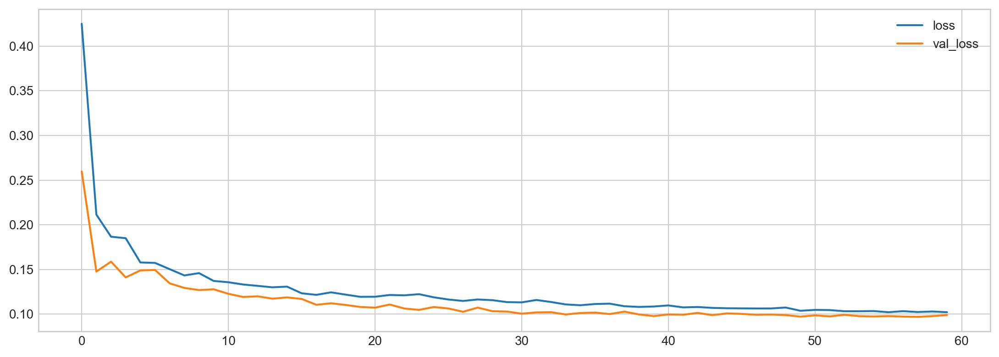

In [2]:
import scipy as scipy
from tensorflow import keras
import numpy as np
import tensorflow as tf
from tensorflow.python.keras import layers
from tensorflow.python.keras.callbacks import EarlyStopping
import pandas as pd

red_wine = pd.read_csv('data/red-wine.csv')
df_train = red_wine.sample(frac=0.7, random_state=0)
# df_valid = red_wine.drop(df_train.index)
red_wine.drop(df_train.index, inplace=True)
df_valid = red_wine.sample(frac=0.5, random_state=0)
df_test = red_wine.drop(df_valid.index)


# Scale to [0, 1]
max_, min_= df_train.max(axis=0), df_train.min(axis=0)
df_train, df_valid, df_test = (df_train - min_) / (max_ - min_), (df_valid - min_) / (max_ - min_), (df_test - min_) / (max_ - min_)

# Split features and target
X_train, X_valid, X_test = df_train.drop('quality', axis=1), df_valid.drop('quality', axis=1), df_test.drop('quality', axis=1)
y_train, y_valid, y_test = df_train['quality'], df_valid['quality'], df_test['quality']

X_train=tf.convert_to_tensor(X_train)
X_valid=tf.convert_to_tensor(X_valid)
X_test=tf.convert_to_tensor(X_test)
y_train=tf.convert_to_tensor(y_train)
y_valid=tf.convert_to_tensor(y_valid)
y_test=tf.convert_to_tensor(y_test)

'''
# single neuron
model = keras.Sequential([
    layers.Dense(units=1, input_shape=[3])      # one basic neuron with three inputs and one output
        # units: how many outputs we want, input_shape: the dimensions of the inputs
])
'''

early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=20,        # stop when 20 epochs less than 0.001 improvement
    restore_best_weights=True,
)

features= X_train.shape[1]
# deep neural network
model = keras.Sequential([

    layers.Dense(units=64, activation='relu', input_shape=[features]), # the hidden ReLU layers

    layers.Dense(units=64),
    #layers.BatchNormalization(),
    #layers.Dense(units=64, activation='relu'),  # activation: apply activation function to each neuron in one layer
    layers.ReLU(),
    layers.Dropout(rate=0.2), # apply 20% dropout to the previous layer

    #layers.BatchNormalization(),
    layers.Dense(units=64),
    layers.ReLU(),
    layers.Dropout(rate=0.2), # apply 30% dropout to the previous layer
    layers.Dense(units=1),  # the linear output layer
    # layers.Dense(1, activation='sigmoid')   # for binary classification
    # layers.Dense(10, activation=tf.nn.softmax)   # for 10 class classification
])

model.compile(optimizer="adam", loss="mae")   # add a loss function and optimizer for the model
# model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['binary_accuracy'],)   # for binary classification
# model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])   # for multiclass classification
history = model.fit(X_train, y_train, validation_data=(X_valid, y_valid), batch_size=256,
    epochs=500, callbacks=[early_stopping])   # verbose=0
history_df = pd.DataFrame(history.history)   # loss and val_loss
history_df.loc[:, ['loss', 'val_loss']].plot()
# history_df.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()     # for binary classification accuracy
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))
print('eval',model.evaluate(X_test, y_test))    # get test set score

pred=model.predict(tf.reshape(X_test, (-1, 11)))
loss = tf.losses.mae(y_test, pred)
loss=tf.reduce_mean(tf.metrics.mean_absolute_error(y_test, pred))
print('manual loss', loss)



# convolutional neural networks
    convolutional neural networks：(convnet or CNN) Convolution is the mathematical operation that gives
    the layers of a convnet their unique structure.
    A convnet used for image classification consists of two parts: a convolutional base and a dense head.
        The base is used to extract the features(a line, a color, a texture, a shape, a pattern, some
        complicated combination.) from an image(mainly convolution layers). The head is used to determine
        the class of the image(mainly dense layer).
    Training the Classifier: The goal of training is to learn two things: which features to extract from
        an image (base), which class goes with what features (head). We reuse the base of a pretrained
        model(most commonly used is ImageNet), instead of train from scratch (reuse the part of a network
        that has already learned to extract features, and attach to it some fresh layers to learn classify.
    Transfer learning: technique of reusing a pretrained model.

    Feature extraction: the base perform feature extraction consists of three basic operations:
        Filter an image for a particular feature (convolution)
        Detect that feature within the filtered image (ReLU)
        Condense the image to enhance the features (maximum pooling)
    Kernel: the 2D rectangle weights matrix a convnet learns during training, which are primarily contained
        in its convolutional layers. A kernel operates by scanning over an image and producing a weighted
        sum of pixel values. In this way, a kernel will act like a polarized lens, emphasizing or
        deemphasizing certain patterns of information. Most often, a kernel will have odd-numbered size
        (kernel_size). The kernels in a convolutional layer determine what kinds of features it creates.
        During training, convnet learn what features it needs to solve the classification problem.
    Feature maps: They are what result when we apply a filter to an image; contain the visual features
        the kernel extracts. With the filters parameter, control how many feature maps in convolutional
        layer to create.
    Activation: After filtering, the feature maps pass through the activation function, mostly use
        rectifier function (ReLU function). Think it as scoring pixel values according to some measure of
        importance. ReLU has the effect of "intensifying" features.
    Maximum Pooling:  like a Conv2D layer, except that it uses a simple maximum function instead of a kernel,
        with no trainable weights. Max pooling takes a patch of activations in the original feature map and
        replaces them with the maximum activation in that patch. The max pooling step with stride>1
        increases the proportion of active pixels to zero pixels. Pooling step was able to intensify the
        feature by condensing the image around the most active pixels. Max pooling remove some positional
        information, give invariance to small differences in the positions of features.
    Strides: determine how far the window should move at each step. Convolutional layers will most often have
        strides=(1, 1). Increasing the stride means that we miss out on potentially valuble information in our
        summary. Maximum pooling layers, however, will almost always have stride values greater than 1
        Sometimes, a model will use a convolution with a larger stride(2) in it's initial layer, coupled with
        a larger kernel, seems to accelerate the production of large-scale features without the sacrifice of
        too much information from the input.
    Padding: describes how we handle the pixels at the edges of the input. padding='valid', the convolution
        window will stay entirely inside the input, but the output shrinks (loses pixels). padding='same',
        pad the input with 0's around its borders to make the size of the output the same, but diluting the
        influence of pixels at the borders.

    A single round of feature extraction can only extract relatively simple features from an image, things like
        simple lines or contrasts. Convnets will repeat this extraction, so that the features become more
        complex and refined as they travel deeper into the network. It does this by passing them through long
        chains of convolutional blocks which perform this extraction. Each block represents a round of
        extraction, and by composing these blocks the convnet can combine and recombine the features produced,
        growing them and shaping them to better fit the problem at hand.

    Data augmentation: add in some extra fake data that looks reasonably like the real data and your classifier
        will improve. More data helps the model to generalize better. If we transform the images in our dataset
        in ways that preserve the class, we can teach classifier to ignore those kinds of transformations (left
        right flip shouldn't change images classification result). Data augmentation can be rotating the image,
        adjusting the color or contrast, warping the image, or many other things, usually applied in combination.
        Each time an image is used during training, a new random transformation is applied. This extra variance
        in the training data help model on new data. Not every transformation will be useful on a given problem.
        Need try and see. Most importantly, whatever transformations you use should not mix up the classes.

        Implementation: The first way is to include it in the data pipeline with a function like
            ImageDataGenerator(cpu). The second way is to include it in the model definition by using Keras's
            preprocessing layers(gpu).

<div>
<img src="img/feature_extraction.png" width="800"/>
</div>

## Pretrain CNN Model

Found 5117 files belonging to 2 classes.
Found 5051 files belonging to 2 classes.
loading trained model 
79/79 [==============================] - 132s 2s/step - loss: 0.3710 - binary_accuracy: 0.8679
[0.3710464835166931, 0.8679469227790833]


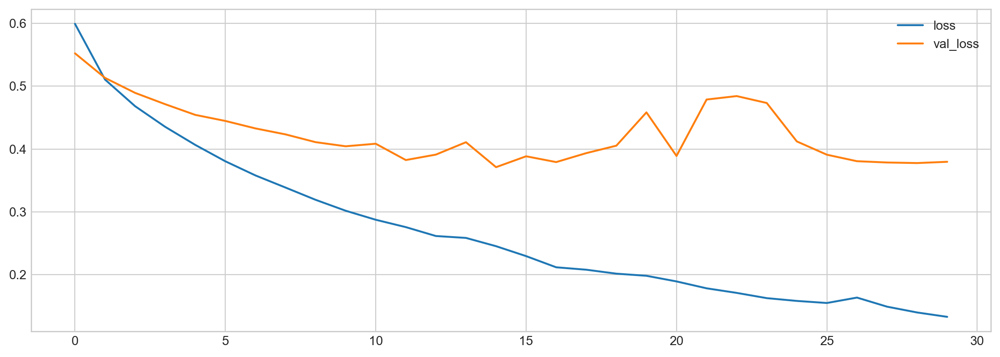

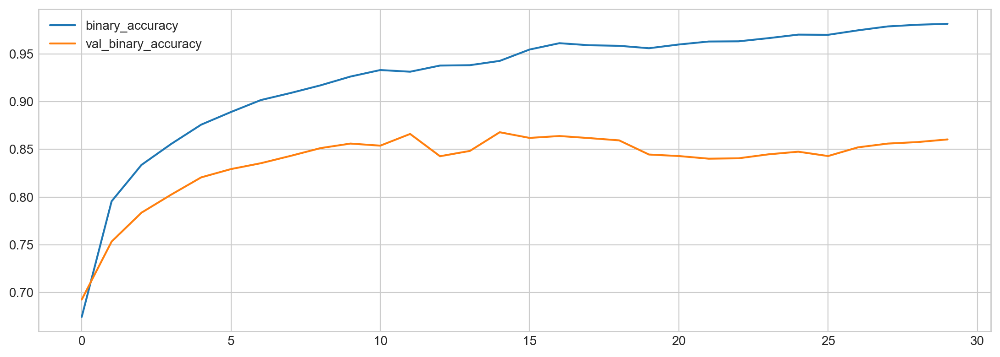

In [3]:
from tensorflow.python.keras.models import load_model
# Imports
import os, warnings
import matplotlib.pyplot as plt
from matplotlib import gridspec

import numpy as np
import tensorflow as tf
# from keras.utils.image_dataset import image_dataset_from_directory
from tensorflow.python.keras.callbacks import EarlyStopping

# Reproducability
def set_seed(seed=88):
    np.random.seed(seed)
    tf.random.set_seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
set_seed(88)

# Set Matplotlib defaults
plt.rc('figure', autolayout=True)
plt.rc('axes', labelweight='bold', labelsize='large',
       titleweight='bold', titlesize=18, titlepad=10)
plt.rc('image', cmap='magma')
warnings.filterwarnings("ignore") # to clean up output cells


# Load training and validation sets
ds_train_ = tf.keras.utils.image_dataset_from_directory(             # BatchDataset one batch (64,128,128,3) images, (64,1) label
    'data/car-or-truck/train',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
    interpolation='nearest',
    batch_size=64,
    shuffle=True,
)
ds_valid_ = tf.keras.utils.image_dataset_from_directory(
    'data/car-or-truck/valid',
    labels='inferred',
    label_mode='binary',
    image_size=[128, 128],
        interpolation='nearest',
    batch_size=64,
    shuffle=False,
)
# Create a callback that saves the model's fit history
filename='car-truck-log.csv'
history_logger=tf.keras.callbacks.CSVLogger(filename, separator=",", append=True)

# Create a callback that saves the model's weights
checkpoint_path = "checkpoint/car-truck/cp.ckpt"
# cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, save_weights_only=True, verbose=1)    # save weight
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path, monitor='val_loss', save_best_only=True, verbose=1)    # save model
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=15,        # stop when 20 epochs less than 0.001 improvement
    restore_best_weights=True,
)

# Data Pipeline
def convert_to_float(image, label):
    image = tf.image.convert_image_dtype(image, dtype=tf.float32)
    return image, label

AUTOTUNE = tf.data.experimental.AUTOTUNE
ds_train = (
    ds_train_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)
ds_valid = (
    ds_valid_
    .map(convert_to_float)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)

pretrained_base = tf.keras.models.load_model(
    'cv-course-models/vgg16-pretrained-base',
)
pretrained_base.trainable = False

model = keras.Sequential([
    pretrained_base,     # output of pretrained base is 2D
    layers.Flatten(),
    layers.Dense(6, activation='relu'),
    layers.Dense(1, activation='sigmoid'),
])


if not os.path.exists('history-car-truck.npy'):
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])
    if os.path.exists(checkpoint_path):
        print('continuing previous training progress ')
        # model.load_weights(checkpoint_path)
        model = load_model(checkpoint_path)
    history_const = model.fit(ds_train, validation_data=ds_valid, epochs=60, verbose=2, callbacks=[history_logger, cp_callback, early_stopping])
    history1 = history_const.history
    np.save('history-car-truck.npy', history1)
else:
    print('loading trained model ')
    history1=np.load('history-car-truck.npy',allow_pickle=True).item()
    # model.load_weights(checkpoint_path)
    model = load_model(checkpoint_path)
history_frame = pd.DataFrame(history1)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()
print(model.evaluate(ds_valid))


## Conv, Activation, Pooling

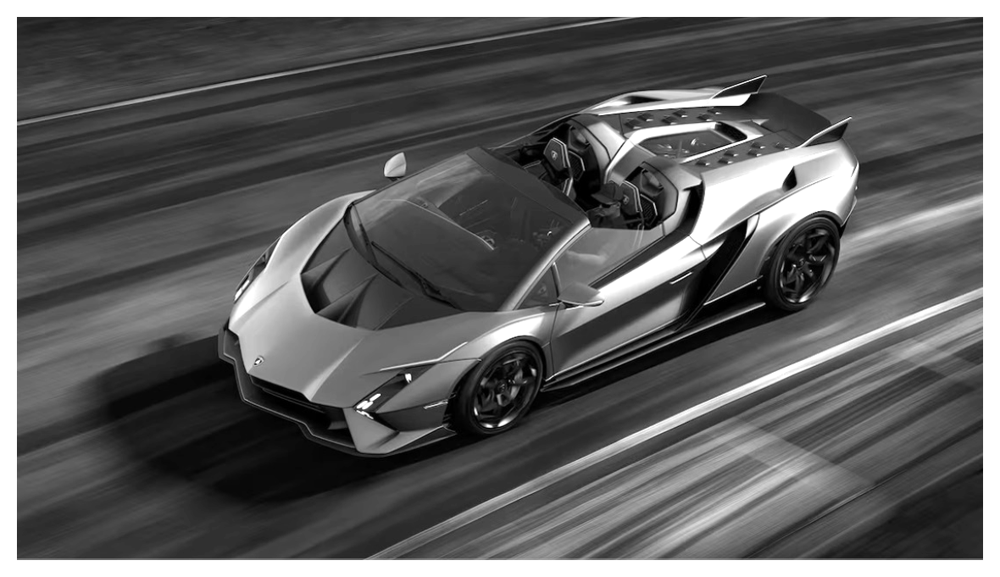

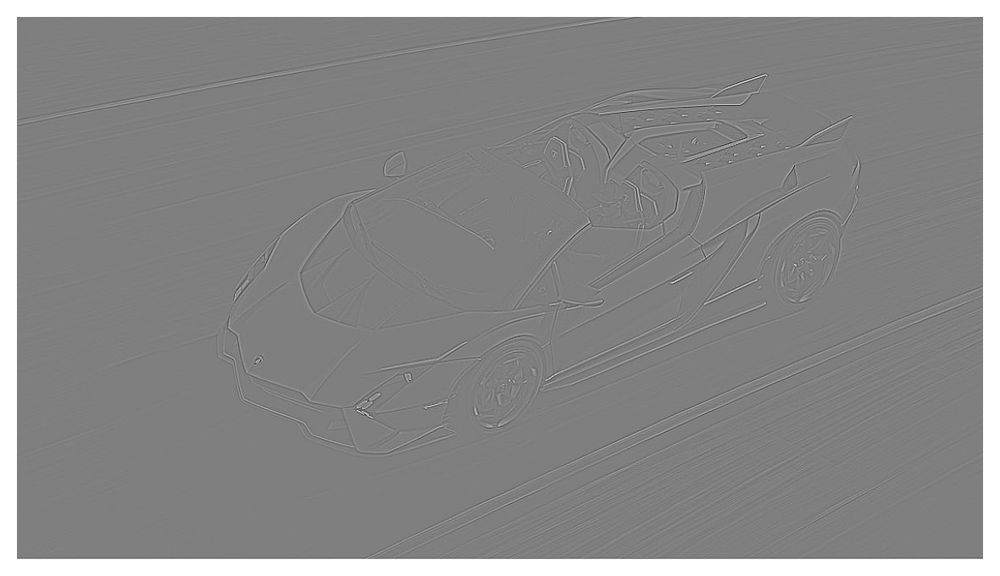

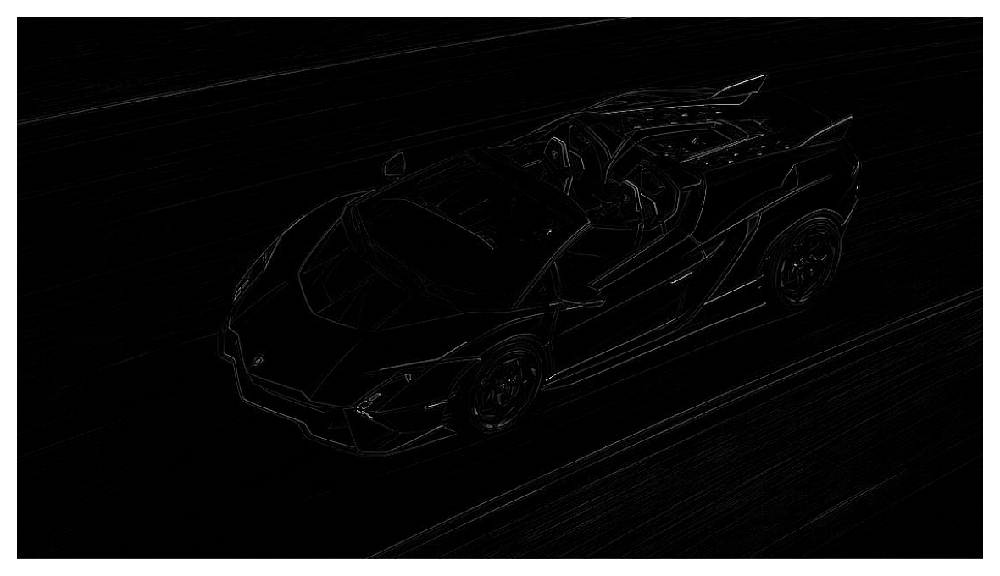

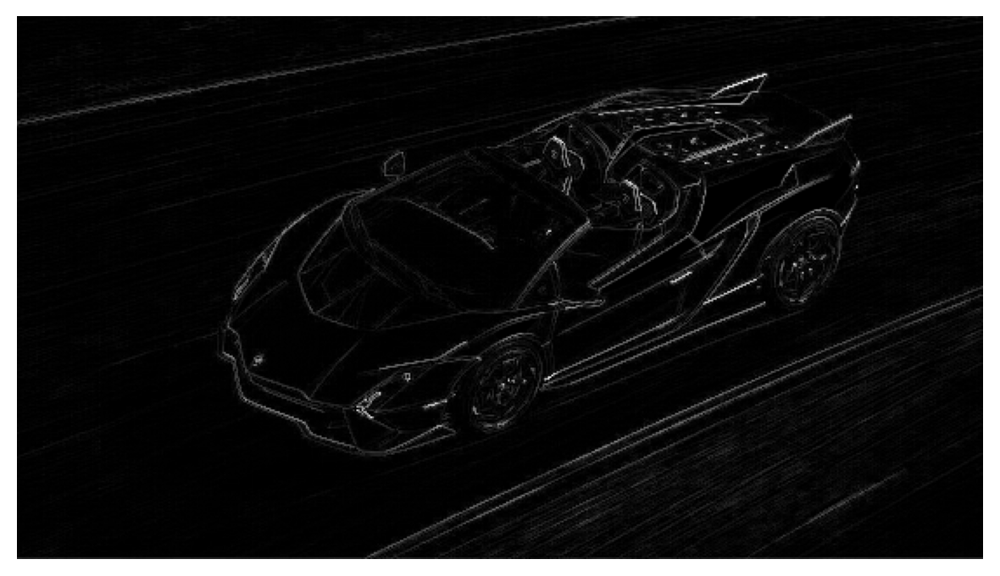

In [4]:
from PIL import Image
import numpy as np
img = Image.open('img/my_car.jpg').convert('L')

img=np.array(img)
img=np.minimum(img*1.5, np.ones_like(img)*255)
plt.figure(figsize=(6,6))
plt.axis('off')
plt.imshow(img,cmap='gray')
plt.show()

img=tf.expand_dims(tf.constant(img, dtype=tf.float32), axis=0)
img=tf.expand_dims(img, axis=3)

kernel_in = np.array([
            [[[-1]], [[-1]], [[-1]]],
            [[[-1]], [[8]], [[-1]]],
            [[[-1]], [[-1]], [[-1]]]
        ])

kernel = tf.constant(kernel_in, dtype=tf.float32)
image_filter = tf.nn.conv2d(img, kernel, strides=[1, 1, 1, 1], padding='VALID')

plt.figure(figsize=(6, 6))
plt.imshow(tf.squeeze(image_filter),cmap='gray')
plt.axis('off')
plt.show()

image_detect = tf.nn.relu(image_filter)

plt.figure(figsize=(6, 6))
plt.imshow(tf.squeeze(image_detect),cmap='gray')
plt.axis('off')
plt.show()

image_condense = tf.nn.pool( input=image_detect, window_shape=(2, 2), pooling_type='MAX',
                             strides=(2, 2), padding='SAME')

plt.figure(figsize=(6, 6))
plt.imshow(tf.squeeze(image_condense),cmap='gray')
plt.axis('off')
plt.show()


# Custom CNN Model

In [6]:
from tensorflow import keras
from tensorflow.python.keras import layers
from tensorflow.python.keras.layers import *
from keras.layers.preprocessing.image_preprocessing import RandomFlip,RandomContrast
model2 = keras.Sequential([
    RandomFlip('horizontal'), # flip left-to-right
    RandomContrast(0.5), # contrast change by up to 50%
    # First Convolutional Block
    layers.Conv2D(filters=32, kernel_size=5, activation="relu", padding='same',
                  # give the input dimensions in the first layer
                  # [height, width, color channels(RGB)]
                  input_shape=[128, 128, 3]),
    layers.MaxPool2D(),

    # Second Convolutional Block
    layers.Conv2D(filters=64, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    # Third Convolutional Block
    layers.Conv2D(filters=128, kernel_size=3, activation="relu", padding='same'),
    layers.MaxPool2D(),

    # Classifier Head
    layers.Flatten(),
    layers.Dense(units=6, activation="relu"),
    layers.Dense(units=1, activation="sigmoid"),
])
model2.build(input_shape=(None,128,128,1))
model2.summary()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy'])
# tf.optimizers.Adam(epsilon=0.01),
history = model.fit(ds_train, validation_data=ds_valid, epochs=40, verbose=2)

history_frame = pd.DataFrame(history.history)
history_frame.loc[:, ['loss', 'val_loss']].plot()
history_frame.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot();

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip_1 (RandomFlip)  (None, 128, 128, 1)       0         
                                                                 
 random_contrast_1 (RandomCo  (None, 128, 128, 1)      0         
 ntrast)                                                         
                                                                 
 module_wrapper_20 (ModuleWr  (None, 128, 128, 32)     832       
 apper)                                                          
                                                                 
 module_wrapper_21 (ModuleWr  (None, 64, 64, 32)       0         
 apper)                                                          
                                                                 
 module_wrapper_22 (ModuleWr  (None, 64, 64, 64)       18496     
 apper)                                               

KeyboardInterrupt: 

# Time Series
    Time series: the basic object of forecasting, which is a set of observations recorded over time.
    Linear Regression with Time Series: learns how to make a weighted sum from its input features. The weights
        are also called regression coefficients and the bias is also called the intercept.
    There are two kinds of features unique to time series: time-step features and lag features.
    Time-step features: derive directly from the time index. The most basic time-step feature is the time dummy,
        which counts off time steps in the series from beginning to end. Time-step features let you model time
        dependence. A series is time dependent if its values can be predicted from the time they occured.
        Alse using DeterministicProcess avoid some tricky failure cases that can arise with time series and
        linear regression.
    Lag features:  shift the observations of the target series so that they appear to have occured later in time.
        from the lag plot (lagged col_1 vs col_1), if there are correlation, then lag feature is useful. lag
        features let you model serial dependence (when observation can be predicted from previous observations).

    Trend: trend component of a time series represents a persistent, long-term change in the mean of the series.
        The trend is the slowest-moving part of a series, representing the largest time scale of importance.
    Moving average plot: compute the average of the values within a sliding window of some defined width for the
        time series. It smooth out any short-term fluctuations in series so that only long-term changes remain.

    Seasonality: there is a regular, periodic change in the mean of the time series. Seasonal changes generally
        follow the clock and calendar -- repetitions over a day, a week, or a year are common. Can forecasting
        any time steps
    Seasonal Indicators: feature best for a season with few observations. Seasonal indicators are what you get
        if you treat a seasonal period as a categorical feature and apply one-hot encoding. Linear regression
        works best if you drop one of the indicators(one-hot generated columns)

    Fourier features: feature best for a season with many observations, capture the overall shape of the seasonal
        curve with just a few features. Fourier features are pairs of sine and cosine curves, one pair for each
        potential frequency in the season starting with the longest. Fourier pairs modeling annual seasonality
        would have frequencies: once per year, twice per year, three times per year, and so on. If we add a set
        of these sine / cosine curves to our training data, the linear regression algorithm will figure out the
        weights that will fit the seasonal component in the target series. need far less features than seasonal
        indicators, which means reduced computation time and less risk of overfitting.
    Periodogram: tells the strength of the frequencies in a time series, used to decide how many pairs of sine/
        cosine needed for Fourier features (check from what's the freqency where variancr start to drop off
        significantly)

    Cycles: are patterns of growth and decay in a time series associated with how the value in a series at one
        time depends on values at previous times, but not necessarily on the time step itself. Cycles are not
        necessarily time dependent(more irregular), as seasons are. What happens in a cycle is less about the
        particular date of occurence, and more about what has happened in the recent past.

    Lag features:  shift the observations of the target series so that they appear to have occured later in time.
        Using lagged series/ plot to detect cycles. To forecast one series y, could use y_lag_1 and y_lag_2 as
        features to predict the target y. A lag plot of a time series shows its values plotted against its lags.
        The most commonly used measure of serial dependence is known as autocorrelation, which is simply the
        correlation a time series has with one of its lags.
    The partial autocorrelation tells you the correlation of a lag accounting for all of the previous lags -- the
        amount of "new" correlation the lag contributes. Plotting the partial autocorrelation(correlogram) can
        help choose which lag features to use (from lag 1 to lag #, where there is less "new" and fell under
        threshold). Autocorrelation and partial autocorrelation only measures of linear dependence. it's best to
        look at a lag plot (or use some more general measure of dependence, like mutual information) when choosing
        lag features. Non-linear relationships can either be transformed to be linear or else learned by an
        appropriate algorithm. limited to forecasting time steps whose lagged values are available.
    leading indicators: model using only lags of the target series as featuresneeds a time step to react to sudden
        changes in the target series (a common limitation). To improve the forecast we could try to find leading
        indicators, time series(new column) that could provide an "early warning" for changes in flu cases.
    Assumed that we could always generate lags up to the period we wanted to forecast (every prediction was for
        just one step forward, in other words)

    Hybrid Models: Linear regression excels at extrapolating trends, but can't learn interactions. XGBoost excels
        at learning interactions, but can't extrapolate trends. Many time series can be closely described by an
        additive model of just these three components (trend, seasons, and cycles) plus some essentially
        unpredictable, entirely random error. Model learning the components of a time series as an iterative
        process (for each component, fit the time series, then subtract fitted data for this component from time
        seies). The residuals of a model are the difference between the target the model was trained on and the
        predictions the model makes.

    There are generally two ways a regression algorithm can make predictions: either by transforming the features
        or by transforming the target.
    Feature-transforming algorithms: learn some mathematical function that takes features as an input and then
        combines and transforms them to produce an output that matches the target values in the training set.
        Linear regression and neural nets are of this kind. Generally can extrapolate target values beyond the
        training set given appropriate features as inputs
    Target-transforming algorithms: use the features to group the target values in the training set and make
        predictions by averaging values in a group; a set of feature just indicates which group to average.
        Decision trees and nearest neighbors are of this kind. Can't extrapolate trend.
    Hybrid Forecasting with Residuals: possible to use one algorithm to fit the original series and then the
        second algorithm to fit the residual series. usually want to use different feature sets (X_train_1 and
        X_train_2 above) depending on what we want each model to learn. (Ex. trend feature only needed for trend
        model).
        The most common strategy for constructing hybrids is the one we've just described: a simple (usually
        linear) learning algorithm followed by a complex, non-linear learner like GBDTs or a deep neural net.
        1. Boosted hybrids: Use linear regression to extrapolate the trend, transform the target to remove the
        trend, and apply XGBoost to the detrended residuals . Or 2. Stacked hybrids: to hybridize a neural net
        (a feature transformer), you could instead include the predictions of another model as a feature, which
        the neural net would then include as part of its own predictions.
    Forecast origin: is time at which you are making a forecast. Everything up to he origin can be used to
        create features.
    Forecast horizon: is the time for which you are making a forecast. We often describe a forecast by the
        number of time steps in its horizon: a "1-step" forecast.
    Lead time (latency):  The time between the origin and the horizon is the of the forecast. A forecast's lead
        time is described by the number of steps from origin to horizon: a "1-step ahead". In practice can start
        forecast multiple steps ahead of the origin.
    Multistep Forecasting Strategies: For multistep forecasts, we are requiring a model to produce multiple
        outputs, one for each step for a single forecast origin. There are a number of strategies:
        Multioutput model: Use a model that produces multiple outputs naturally. Linear regression and neural
            networks can both produce multiple outputs. This strategy is simple and efficient, but not possible
            for every algorithm you might want to use.
        Direct strategy: Train a separate model for each step in the horizon. Forecasting 1-step ahead is a
            different problem than 2-steps ahead (and so on), training lots of models can be computationally
            expensive.
        Recursive strategy: Train a single one-step model and use its forecasts to update the lag features for
            the next step. Only need to train one model, but since errors will propagate from step to step,
            forecasts can be naccurate for long horizons.
        DirRec strategy: A combination of the direct and recursive strategies: train a model for each step and
            use forecasts from previous steps as new lag features. Step by step, each model gets an additional
            lag input. DirRec strategy can capture serial dependence better than Direct, but also suffer from
            error propagation like Recursive.




## Time Step Feature & Lag Feature

22.49744953347821 98176.20634409295
0.5329660641208303 49780.6248690696
[22.49744953] 98176.20634409295
[0.53296606] 49780.624869069565


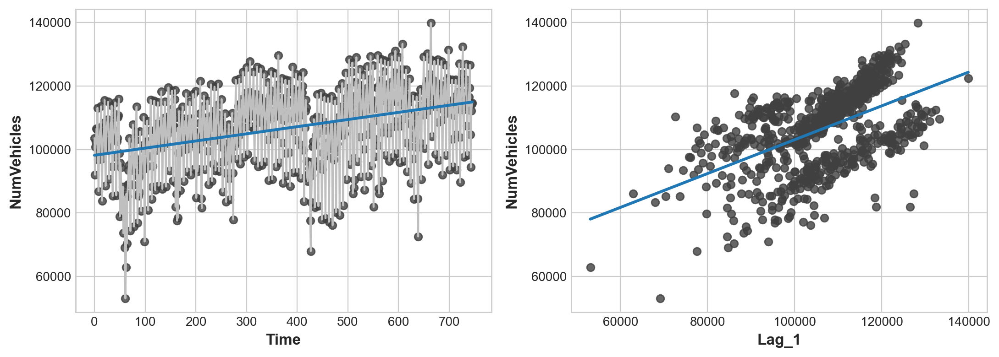

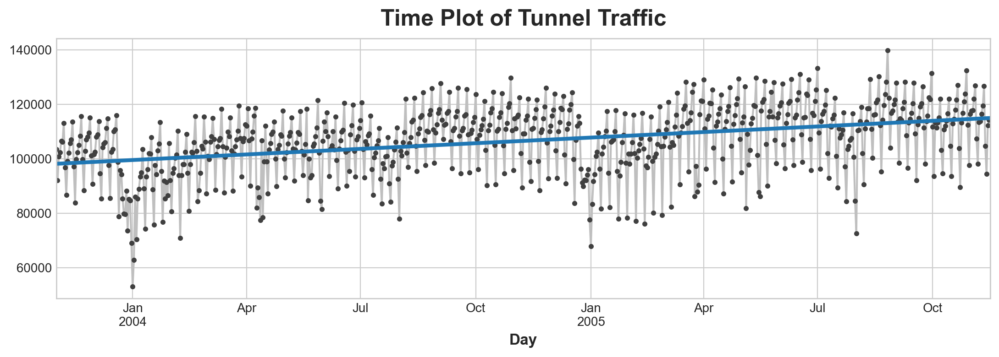

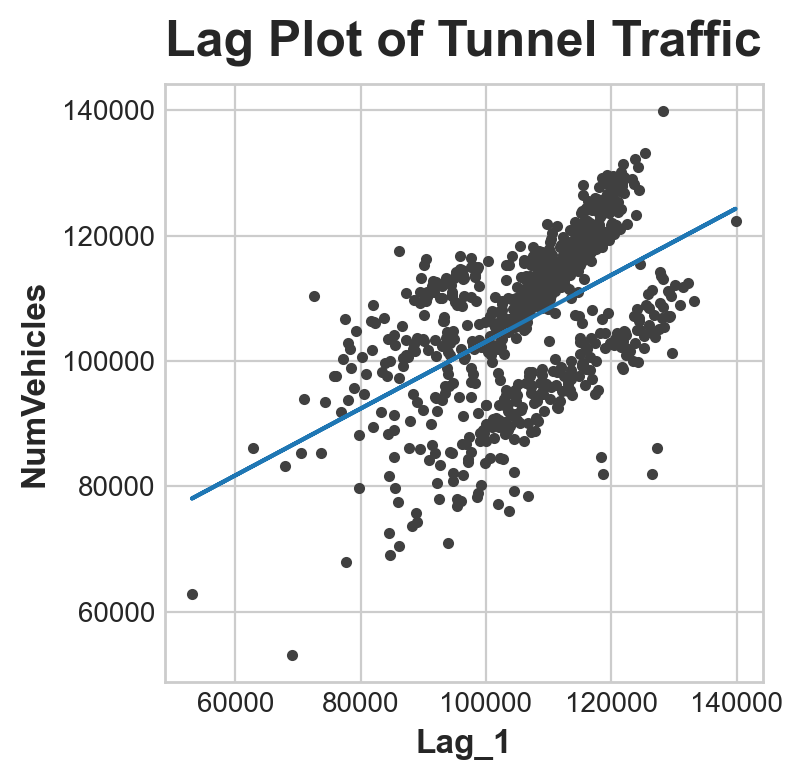

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
from sklearn.linear_model import LinearRegression

df = pd.read_csv("data/tunnel.csv", index_col='Day', parse_dates=["Day"])
df['Time'] = np.arange(len(df.index))
fig, ax = plt.subplots(1, 2)
ax[0].plot('Time', 'NumVehicles', data=df, color='0.75')
p = sns.regplot(ax=ax[0], x='Time', y='NumVehicles', data=df, ci=None, scatter_kws=dict(color='0.25'))
slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
                                                       y=p.get_lines()[0].get_ydata())
print(slope, intercept)

df['Lag_1'] = df['NumVehicles'].shift(1)
df = df.reindex(columns=['NumVehicles', 'Lag_1', 'Time'])  # change columns order, columns can add new column with NaN value
p = sns.regplot(ax=ax[1], x='Lag_1', y='NumVehicles', data=df, ci=None, scatter_kws=dict(color='0.25'))#
slope, intercept, r, p, sterr = scipy.stats.linregress(x=p.get_lines()[0].get_xdata(),
                                                       y=p.get_lines()[0].get_ydata())
print(slope, intercept)



# Time-step features
X = df.loc[:, ['Time']]  # features
y = df.loc[:, 'NumVehicles']  # target

model = LinearRegression()
model.fit(X, y)
print(model.coef_, model.intercept_)
y_pred = pd.Series(model.predict(X), index=X.index)

plt.figure()
ax = y.plot(**plot_params)
ax = y_pred.plot(ax=ax, linewidth=3)
ax.set_title('Time Plot of Tunnel Traffic');



# Lag feature
X = df.loc[:, ['Lag_1']]
X.dropna(inplace=True)  # drop missing values in the feature set
y = df.loc[:, 'NumVehicles']  # create the target
y, X = y.align(X, join='inner')  # drop corresponding values in target

model = LinearRegression()
model.fit(X, y)
print(model.coef_, model.intercept_)
y_pred = pd.Series(model.predict(X), index=X.index)

fig, ax =plt.subplots()
ax.plot(X['Lag_1'], y, '.', color='0.25')
ax.plot(X['Lag_1'], y_pred)
ax.set_aspect('equal')
ax.set_ylabel('NumVehicles')
ax.set_xlabel('Lag_1')
ax.set_title('Lag Plot of Tunnel Traffic');

## Forecast with Trend

            const  trend
Day                     
2003-11-01    1.0    1.0
2003-11-02    1.0    2.0
2003-11-03    1.0    3.0
2003-11-04    1.0    4.0
2003-11-05    1.0    5.0 <class 'pandas.core.frame.DataFrame'>
2005-11-17    114981.801146
2005-11-18    115004.298595
2005-11-19    115026.796045
2005-11-20    115049.293494
2005-11-21    115071.790944
Freq: D, dtype: float64


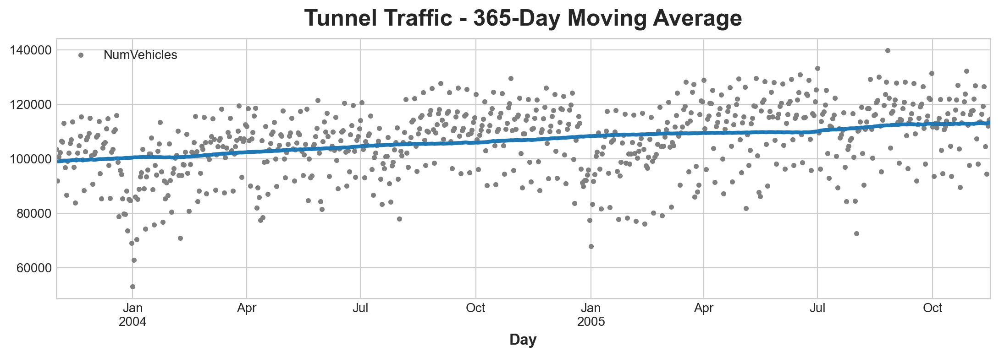

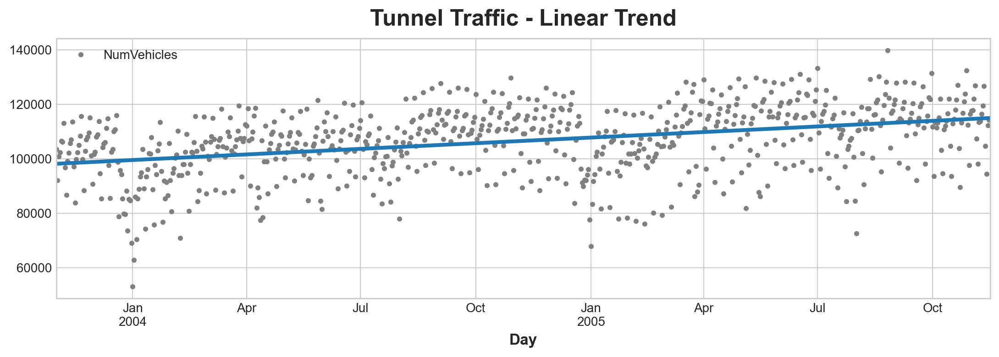

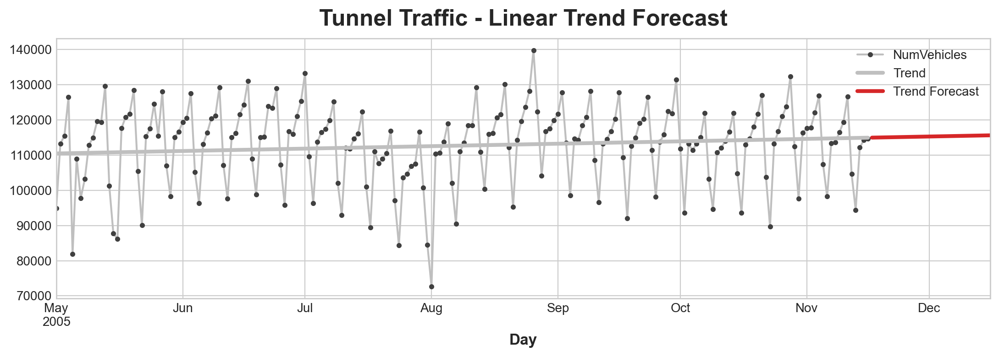

In [8]:
from statsmodels.tsa.deterministic import DeterministicProcess
from sklearn.linear_model import LinearRegression

df = pd.read_csv("data/tunnel.csv", parse_dates=["Day"])
df = df.set_index("Day").to_period()   # Convert DataFrame from DatetimeIndex to PeriodIndex.
moving_average = df.rolling(               # for current index i, calculate [max(0, i-182), min(i+182, len(df.index)] mean
    window=365,       # 365-day window
    center=True,      # puts the average at the center of the window
    min_periods=183,  # choose about half the window size
).mean()              # compute the mean (could also do median, std, min, max, ...)
ax = df.plot(style=".", color="0.5")
moving_average.plot(ax=ax, linewidth=3, title="Tunnel Traffic - 365-Day Moving Average", legend=False)


# same as time-step features, avoid some tricky failure cases that can arise with time series and linear regression
# only generate a time-step features, other columns are ignored
dp = DeterministicProcess(
    index=df.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept) default 1
    order=1,             # the time dummy (trend), 1 for linear, 2 for quadratic, 3 for cubic, and so on
    drop=True,           # drop terms if necessary to avoid collinearity
)
# `in_sample` creates features for the dates given in the `index` argument
X = dp.in_sample()
print(X.head(), type(X))


y = df["NumVehicles"]  # the target

# The intercept is the same as the `const` feature from
# DeterministicProcess. LinearRegression behaves badly with duplicated
# features, so we need to be sure to exclude it here.
model = LinearRegression(fit_intercept=False)
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)
ax = df.plot(style=".", color="0.5", title="Tunnel Traffic - Linear Trend")
_ = y_pred.plot(ax=ax, linewidth=3, label="Trend")

X = dp.out_of_sample(steps=30)     # create addition time-step features value for next 30 steps
y_fore = pd.Series(model.predict(X), index=X.index)
print(y_fore.head())

ax = df["2005-05":].plot(title="Tunnel Traffic - Linear Trend Forecast", **plot_params)
ax = y_pred["2005-05":].plot(ax=ax, linewidth=3, label="Trend", color="0.75")
ax = y_fore.plot(ax=ax, linewidth=3, label="Trend Forecast", color="C3")
_ = ax.legend()


## Forecast with Seasonality (Fourier features)

            const  trend  s(2,7)  s(3,7)  s(4,7)  s(5,7)  s(6,7)  s(7,7)  \
Day                                                                        
2003-11-01    1.0    1.0     0.0     0.0     0.0     0.0     0.0     0.0   
2003-11-02    1.0    2.0     1.0     0.0     0.0     0.0     0.0     0.0   
2003-11-03    1.0    3.0     0.0     1.0     0.0     0.0     0.0     0.0   
2003-11-04    1.0    4.0     0.0     0.0     1.0     0.0     0.0     0.0   
2003-11-05    1.0    5.0     0.0     0.0     0.0     1.0     0.0     0.0   

            sin(1,freq=A-DEC)  cos(1,freq=A-DEC)  ...  sin(6,freq=A-DEC)  \
Day                                               ...                      
2003-11-01          -0.867456           0.497513  ...          -0.017213   
2003-11-02          -0.858764           0.512371  ...           0.085965   
2003-11-03          -0.849817           0.527078  ...           0.188227   
2003-11-04          -0.840618           0.541628  ...           0.288482   
2003-11-05 

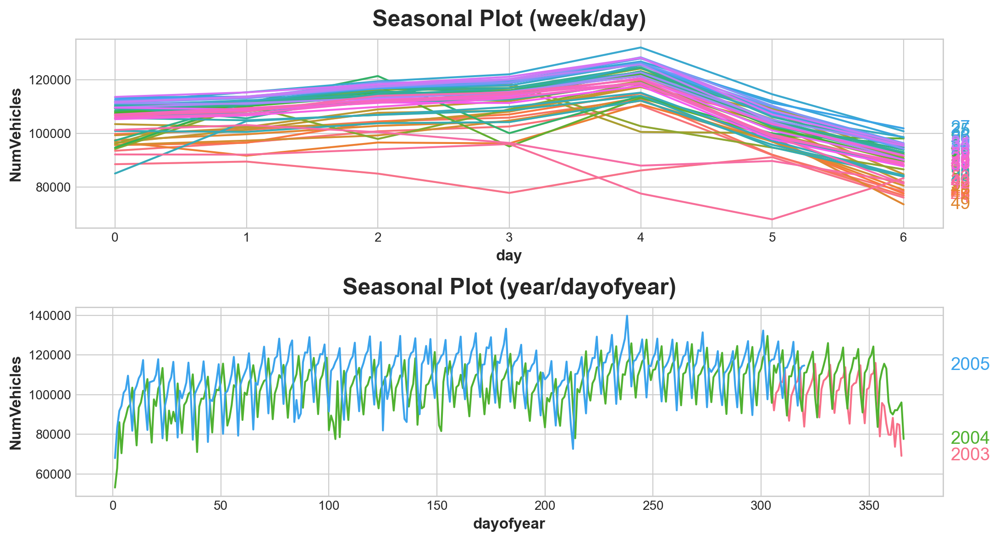

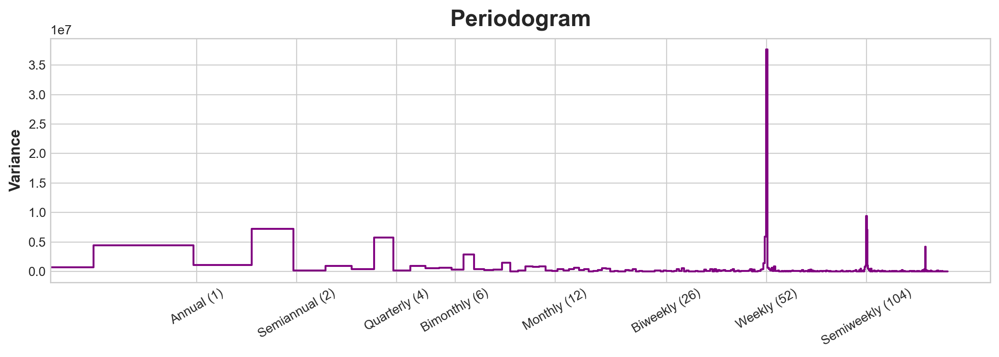

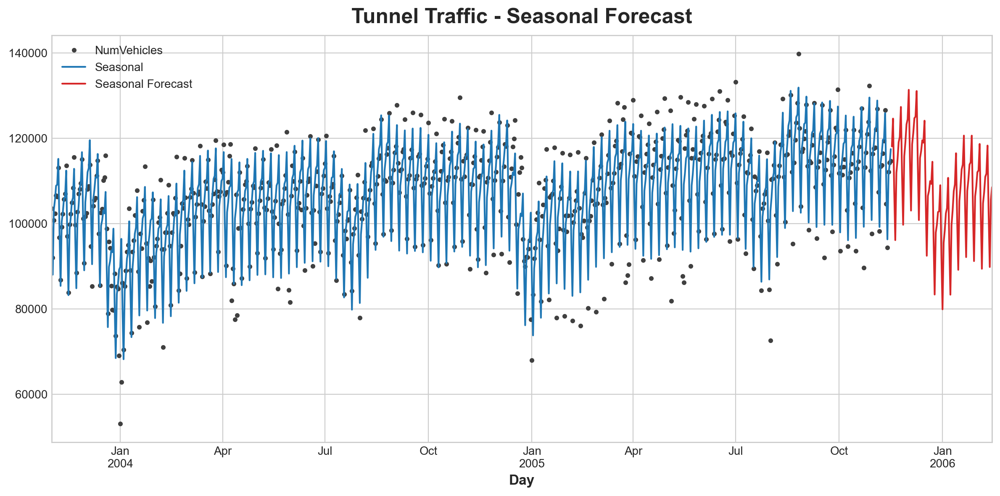

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax



tunnel = pd.read_csv("data/tunnel.csv", parse_dates=["Day"])
tunnel = tunnel.set_index("Day").to_period("D")
X = tunnel.copy()

# days within a week
X["day"] = X.index.dayofweek  # the x-axis (freq)
X["week"] = X.index.week  # the seasonal period (period)

# days within a year
X["dayofyear"] = X.index.dayofyear
X["year"] = X.index.year
fig, (ax0, ax1) = plt.subplots(2, 1, figsize=(11, 6))
seasonal_plot(X, y="NumVehicles", period="week", freq="day", ax=ax0)
seasonal_plot(X, y="NumVehicles", period="year", freq="dayofyear", ax=ax1)

plot_periodogram(tunnel.NumVehicles)
# The weekly season we'll model with indicators and the annual season with Fourier features.
# From right to left, the periodogram falls off between Bimonthly (6) and Monthly (12), so let's use 10 Fourier pairs.

fourier = CalendarFourier(freq="A", order=10)  # 10 sin/cos pairs for "A"nnual seasonality

dp = DeterministicProcess(
    index=tunnel.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # trend (order 1 means linear)
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X = dp.in_sample()  # create features for dates in tunnel.index
print(X.head())
y = tunnel["NumVehicles"]

model = LinearRegression(fit_intercept=False)
_ = model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=y.index)
X_fore = dp.out_of_sample(steps=90)
y_fore = pd.Series(model.predict(X_fore), index=X_fore.index)

plt.figure(figsize=(12,6))
ax = y.plot(color='0.25', style='.', title="Tunnel Traffic - Seasonal Forecast")
ax = y_pred.plot(ax=ax, label="Seasonal")
ax = y_fore.plot(ax=ax, label="Seasonal Forecast", color='C3')
_ = ax.legend()

## Cycle, Partial Autocorrelation, Lag Feature, Leading Indicators

In [ ]:
from sklearn.model_selection import train_test_split
from statsmodels.graphics.tsaplots import plot_pacf
def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax


def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):
    import math
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig


flu_trends = pd.read_csv("data/flu-trends.csv")
flu_trends.set_index(
    pd.PeriodIndex(flu_trends.Week, freq="W"),
    inplace=True,
)
flu_trends.drop("Week", axis=1, inplace=True)

ax = flu_trends.FluVisits.plot(title='Flu Trends')
_ = ax.set(ylabel="Office Visits")
_ = plot_lags(flu_trends.FluVisits, lags=12, nrows=2)
# the partial autocorrelations suggest the dependence can be captured using lags 1, 2, 3, and 4.
_ = plot_pacf(flu_trends.FluVisits, lags=12)

def make_lags(ts, lags):

    if isinstance(ts, pd.Series):
        return pd.concat({f'y_lag_{i}': ts.shift(i) for i in range(1, lags + 1)}, axis=1)

    elif isinstance(ts, pd.DataFrame):
        return pd.concat({f'y_lag_{i}_{col}': ts[col].shift(i) for i in range(1, lags + 1) for col in ts.columns}, axis=1)
    return ts

X = make_lags(flu_trends.FluVisits, lags=4)
X = X.fillna(0.0)

y = flu_trends.FluVisits.copy()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=60, shuffle=False)

# Fit and predict
model = LinearRegression()  # `fit_intercept=True` since we didn't use DeterministicProcess
model.fit(X_train, y_train)
y_pred = pd.Series(model.predict(X_train), index=y_train.index)
y_fore = pd.Series(model.predict(X_test), index=y_test.index)

plt.figure(figsize=(15,6))
ax = y_train.plot()
ax = y_test.plot()
ax = y_pred.plot(ax=ax)
_ = y_fore.plot(ax=ax, color='C3')   # significant lag of prediction


plt.figure(figsize=(15,6))
ax = y_test.plot(**plot_params)
_ = y_fore.plot(ax=ax, color='C3')

ax = flu_trends.plot(y=["FluCough", "FluVisits"], secondary_y="FluCough")
search_terms = ["FluContagious", "FluCough", "FluFever", "InfluenzaA", "TreatFlu", "IHaveTheFlu", "OverTheCounterFlu", "HowLongFlu"]

X0 = make_lags(flu_trends[search_terms], lags=3)
X1 = make_lags(flu_trends['FluVisits'], lags=4)

X = pd.concat([X0, X1], axis=1).fillna(0.0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=60, shuffle=False)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = pd.Series(model.predict(X_train), index=y_train.index)
y_fore = pd.Series(model.predict(X_test), index=y_test.index)

plt.figure(figsize=(15,6))
ax = y_test.plot(**plot_params)
_ = y_fore.plot(ax=ax, color='C3')
# still not good, just approximately predict new data on a line of previous 2 points,
# can only predict when the lag has value for real world forecast

## Hybrid Models

In [ ]:
industries = ["BuildingMaterials", "FoodAndBeverage"]
retail = pd.read_csv("data/us-retail-sales.csv", usecols=['Month'] + industries,
    parse_dates=['Month'], index_col='Month').to_period('D').reindex(columns=industries)
retail = pd.concat({'Sales': retail}, names=[None, 'Industries'], axis=1)
print(retail.head())

y = retail.copy()

# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)
X = dp.in_sample()  # features for the training data

# Test on the years 2016-2019. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(y.index, test_size=12 * 4, shuffle=False)
X_train, X_test = X.loc[idx_train], X.loc[idx_test]  #X.loc[idx_train, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]


# Fit trend model, linear regression algorithm is capable of multi-output regression
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(model.predict(X_train), index=y_train.index, columns=y_train.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=y_test.index, columns=y_test.columns)

print(X_train.head(), y_train.head())
# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")


# the XGBoost algorithm is not capable of multi-output regression,
# The `stack` method converts column labels to row labels, pivoting from wide format to long
X = retail.stack()  # pivot dataset wide to long
y = X.pop('Sales')  # grab target series, y is a series with multi-index(month, industries)
# Turn row labels into categorical feature columns with a label encoding
X = X.reset_index('Industries')
# Label encoding for 'Industries' feature
for colname in X.select_dtypes(["object", "category"]):
    X[colname], _ = X[colname].factorize()

# Label encoding for annual seasonality
X["Month"] = X.index.month  # values are 1, 2, ..., 12

# Create splits
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]
print(X_train.head())
print(y_train.head())

# Pivot wide to long (stack) and convert DataFrame to Series (squeeze)
y_fit = y_fit.stack().squeeze()    # trend from training set
y_pred = y_pred.stack().squeeze()  # trend from test set

# Create residuals (the collection of detrended series) from the training set
y_resid = y_train - y_fit

# Train XGBoost on the residuals
xgb = XGBRegressor()
xgb.fit(X_train, y_resid)

# Add the predicted residuals onto the predicted trends
y_fit_boosted = xgb.predict(X_train) + y_fit
y_pred_boosted = xgb.predict(X_test) + y_pred

axs = y_train.unstack(['Industries']).plot(
    color='0.25', figsize=(11, 5), subplots=True, sharex=True,
    title=['BuildingMaterials', 'FoodAndBeverage'],
)
axs = y_test.unstack(['Industries']).plot(
    color='0.25', subplots=True, sharex=True, ax=axs,
)
axs = y_fit_boosted.unstack(['Industries']).plot(
    color='C0', subplots=True, sharex=True, ax=axs,
)
axs = y_pred_boosted.unstack(['Industries']).plot(
    color='C3', subplots=True, sharex=True, ax=axs,
)
for ax in axs: ax.legend([])

## Multistep Forecasting

## Hybrid Models

                       Sales                
Industries BuildingMaterials FoodAndBeverage
Month                                       
1992-01-01              8964           29589
1992-02-01              9023           28570
1992-03-01             10608           29682
1992-04-01             11630           30228
1992-05-01             12327           31677
            const  trend  trend_squared
Month                                  
1992-01-01    1.0    1.0            1.0
1992-02-01    1.0    2.0            4.0
1992-03-01    1.0    3.0            9.0
1992-04-01    1.0    4.0           16.0
1992-05-01    1.0    5.0           25.0                        Sales                
Industries BuildingMaterials FoodAndBeverage
Month                                       
1992-01-01              8964           29589
1992-02-01              9023           28570
1992-03-01             10608           29682
1992-04-01             11630           30228
1992-05-01             12327           31677


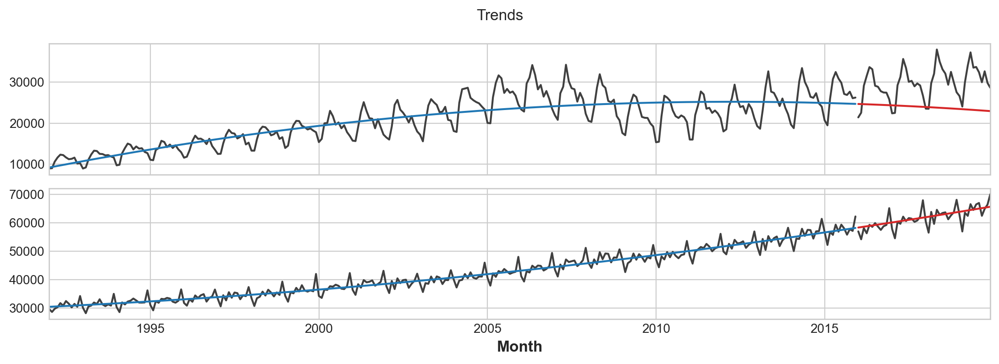

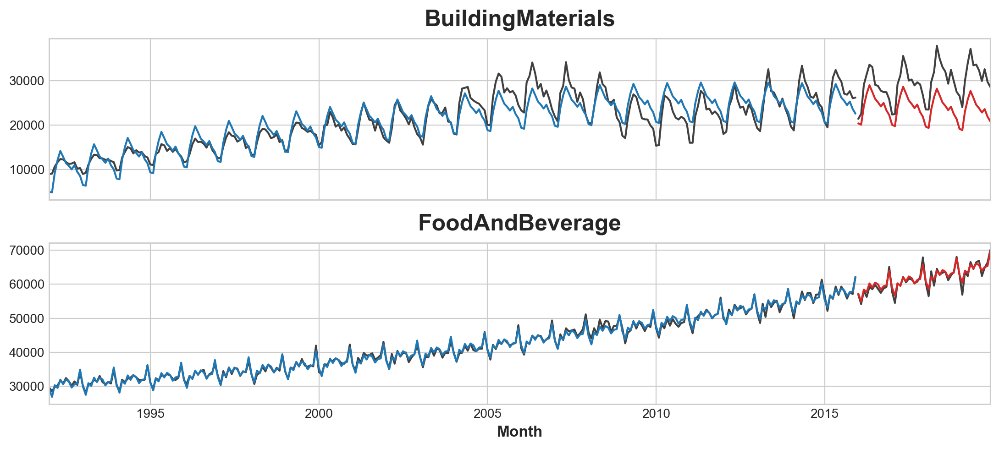

In [11]:
industries = ["BuildingMaterials", "FoodAndBeverage"]
retail = pd.read_csv("data/us-retail-sales.csv", usecols=['Month'] + industries,
    parse_dates=['Month'], index_col='Month').to_period('D').reindex(columns=industries)
retail = pd.concat({'Sales': retail}, names=[None, 'Industries'], axis=1)
print(retail.head())

y = retail.copy()

# Create trend features
dp = DeterministicProcess(
    index=y.index,  # dates from the training data
    constant=True,  # the intercept
    order=2,        # quadratic trend
    drop=True,      # drop terms to avoid collinearity
)
X = dp.in_sample()  # features for the training data

# Test on the years 2016-2019. It will be easier for us later if we
# split the date index instead of the dataframe directly.
idx_train, idx_test = train_test_split(y.index, test_size=12 * 4, shuffle=False)
X_train, X_test = X.loc[idx_train], X.loc[idx_test]  #X.loc[idx_train, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]


# Fit trend model, linear regression algorithm is capable of multi-output regression
model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

# Make predictions
y_fit = pd.DataFrame(model.predict(X_train), index=y_train.index, columns=y_train.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=y_test.index, columns=y_test.columns)

print(X_train.head(), y_train.head())
# Plot
axs = y_train.plot(color='0.25', subplots=True, sharex=True)
axs = y_test.plot(color='0.25', subplots=True, sharex=True, ax=axs)
axs = y_fit.plot(color='C0', subplots=True, sharex=True, ax=axs)
axs = y_pred.plot(color='C3', subplots=True, sharex=True, ax=axs)
for ax in axs: ax.legend([])
_ = plt.suptitle("Trends")


# the XGBoost algorithm is not capable of multi-output regression,
# The `stack` method converts column labels to row labels, pivoting from wide format to long
X = retail.stack()  # pivot dataset wide to long
y = X.pop('Sales')  # grab target series, y is a series with multi-index(month, industries)
# Turn row labels into categorical feature columns with a label encoding
X = X.reset_index('Industries')
# Label encoding for 'Industries' feature
for colname in X.select_dtypes(["object", "category"]):
    X[colname], _ = X[colname].factorize()

# Label encoding for annual seasonality
X["Month"] = X.index.month  # values are 1, 2, ..., 12

# Create splits
X_train, X_test = X.loc[idx_train, :], X.loc[idx_test, :]
y_train, y_test = y.loc[idx_train], y.loc[idx_test]
print(X_train.head())
print(y_train.head())

# Pivot wide to long (stack) and convert DataFrame to Series (squeeze)
y_fit = y_fit.stack().squeeze()    # trend from training set
y_pred = y_pred.stack().squeeze()  # trend from test set

# Create residuals (the collection of detrended series) from the training set
y_resid = y_train - y_fit

# Train XGBoost on the residuals
xgb = XGBRegressor()
xgb.fit(X_train, y_resid)

# Add the predicted residuals onto the predicted trends
y_fit_boosted = xgb.predict(X_train) + y_fit
y_pred_boosted = xgb.predict(X_test) + y_pred

axs = y_train.unstack(['Industries']).plot(
    color='0.25', figsize=(11, 5), subplots=True, sharex=True,
    title=['BuildingMaterials', 'FoodAndBeverage'],
)
axs = y_test.unstack(['Industries']).plot(
    color='0.25', subplots=True, sharex=True, ax=axs,
)
axs = y_fit_boosted.unstack(['Industries']).plot(
    color='C0', subplots=True, sharex=True, ax=axs,
)
axs = y_pred_boosted.unstack(['Industries']).plot(
    color='C3', subplots=True, sharex=True, ax=axs,
)
for ax in axs: ax.legend([])

## Multistep Forecasting

Train RMSE: 389.12
Test RMSE: 582.33
Train RMSE: 1.22
Test RMSE: 526.45


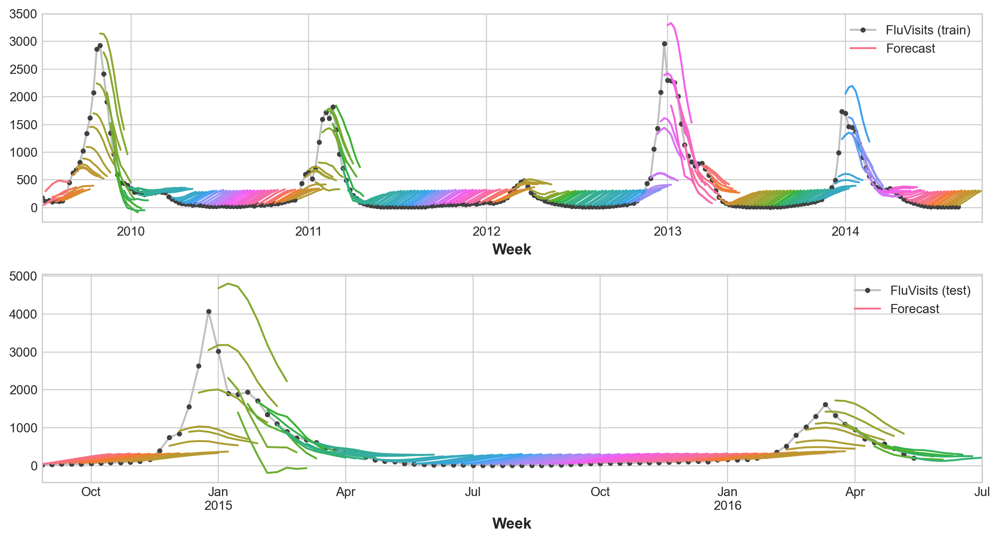

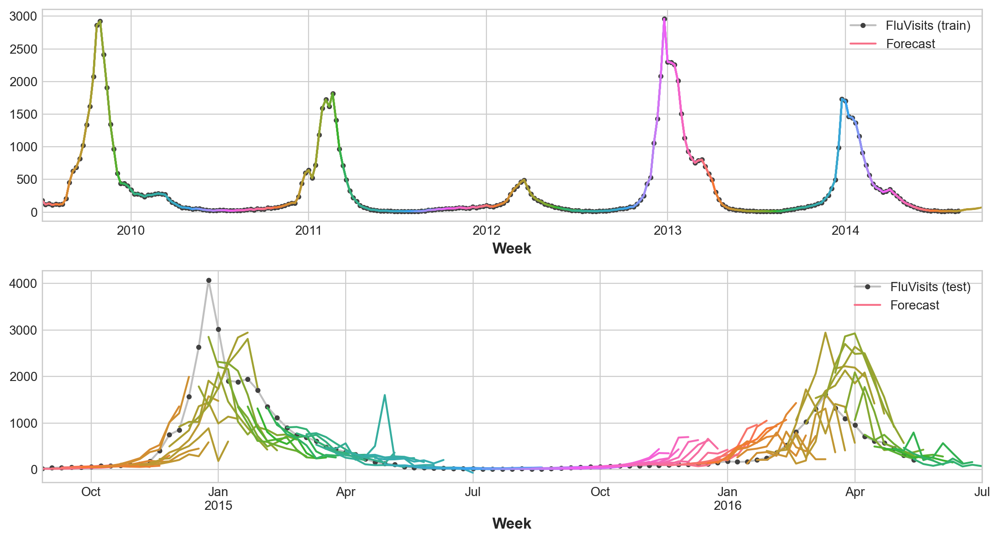

In [12]:
from sklearn.metrics import mean_squared_error
from sklearn.multioutput import MultiOutputRegressor

def plot_multistep(y, every=1, ax=None, palette_kwargs=None):
    palette_kwargs_ = dict(palette='husl', n_colors=16, desat=None)
    if palette_kwargs is not None:
        palette_kwargs_.update(palette_kwargs)
    palette = sns.color_palette(**palette_kwargs_)
    if ax is None:
        fig, ax = plt.subplots()
    ax.set_prop_cycle(plt.cycler('color', palette))
    for date, preds in y[::every].iterrows():
        preds.index = pd.period_range(start=date, periods=len(preds))
        preds.plot(ax=ax)
    return ax

def make_lags(ts, lags, lead_time=1):
    return pd.concat({f'y_lag_{i}': ts.shift(i) for i in range(lead_time, lags + lead_time)}, axis=1)

def make_multistep_target(ts, steps):
    return pd.concat({f'y_step_{i + 1}': ts.shift(-i) for i in range(steps)}, axis=1)

def myplot(df, y_fit, y_pred):
    palette = dict(palette='husl', n_colors=64)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 6))
    ax1 = df.FluVisits[y_fit.index].plot(**plot_params, ax=ax1)
    ax1 = plot_multistep(y_fit, ax=ax1, palette_kwargs=palette)
    _ = ax1.legend(['FluVisits (train)', 'Forecast'])
    ax2 = df.FluVisits[y_pred.index].plot(**plot_params, ax=ax2)
    ax2 = plot_multistep(y_pred, ax=ax2, palette_kwargs=palette)
    _ = ax2.legend(['FluVisits (test)', 'Forecast'])

flu_trends = pd.read_csv("data/flu-trends.csv")
flu_trends.set_index(pd.PeriodIndex(flu_trends.Week, freq="W"), inplace=True)
flu_trends.drop("Week", axis=1, inplace=True)

y = flu_trends.FluVisits.copy()
X = make_lags(y, lags=4).fillna(0.0)  # Four weeks of lag features
y = make_multistep_target(y, steps=8).dropna()  # Eight-week forecast
# Shifting has created indexes that don't match. Only keep times for which we have both targets and features.
y, X = y.align(X, join='inner', axis=0)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=False)

# Multioutput model
model = LinearRegression()
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}")

myplot(flu_trends, y_fit, y_pred)

# Direct
# XGBoost can't produce multiple outputs for regression tasks. But by applying the Direct
# reduction strategy, we can still use it to produce multi-step forecasts
model = MultiOutputRegressor(XGBRegressor())
model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}")

myplot(flu_trends, y_fit, y_pred)

Epoch 1/500
9/9 [==============================] - 1s 22ms/step - loss: 396.0291 - val_loss: 549.1127
Epoch 2/500
9/9 [==============================] - 0s 5ms/step - loss: 395.7055 - val_loss: 549.0117
Epoch 3/500
9/9 [==============================] - 0s 5ms/step - loss: 395.3564 - val_loss: 548.8575
Epoch 4/500
9/9 [==============================] - 0s 5ms/step - loss: 394.9579 - val_loss: 548.6395
Epoch 5/500
9/9 [==============================] - 0s 5ms/step - loss: 394.5661 - val_loss: 548.3438
Epoch 6/500
9/9 [==============================] - 0s 5ms/step - loss: 393.7687 - val_loss: 547.9141
Epoch 7/500
9/9 [==============================] - 0s 5ms/step - loss: 393.1733 - val_loss: 547.3401
Epoch 8/500
9/9 [==============================] - 0s 5ms/step - loss: 392.0639 - val_loss: 546.5798
Epoch 9/500
9/9 [==============================] - 0s 5ms/step - loss: 390.8323 - val_loss: 545.5406
Epoch 10/500
9/9 [==============================] - 0s 5ms/step - loss: 389.1374 - val_los

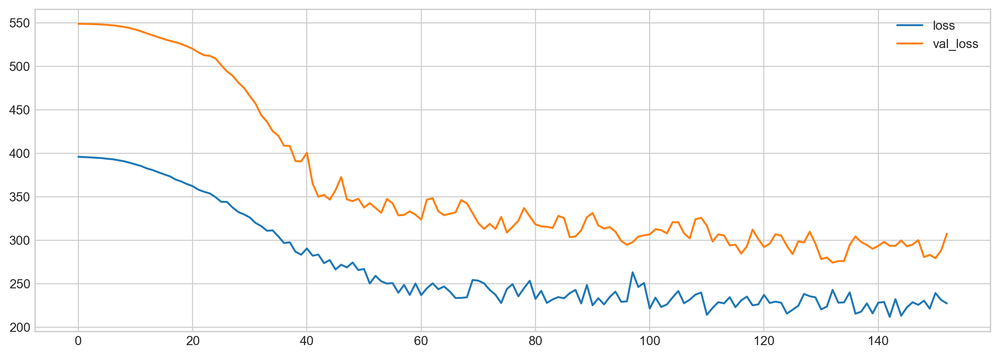

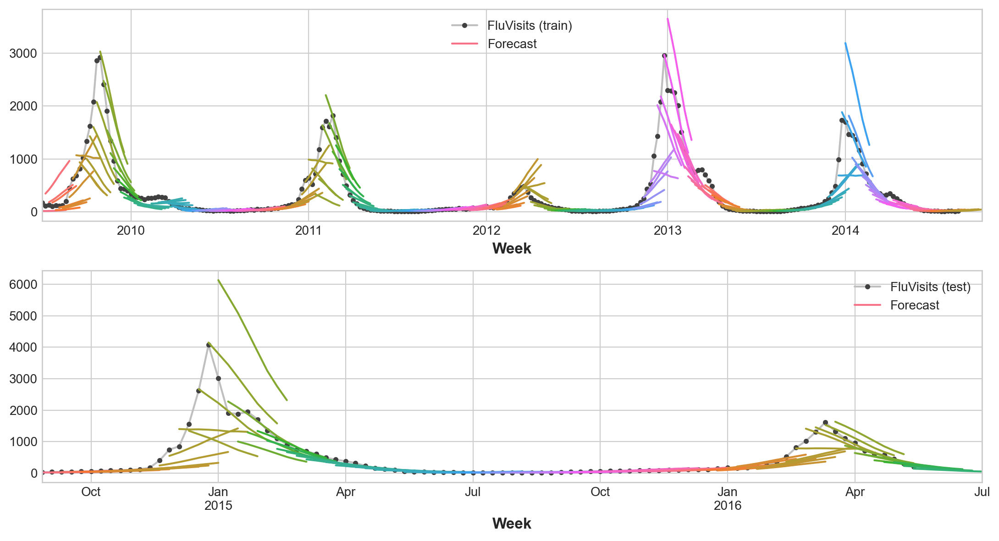

In [13]:
from keras.layers.normalization.batch_normalization import BatchNormalization
X_train_=X_train.copy()
X_test_=X_test.copy()
y_train_=y_train.copy()
y_test_=y_test.copy()

# X_train=tf.convert_to_tensor(X_train)
# X_test=tf.convert_to_tensor(X_test)
# y_train=tf.convert_to_tensor(y_train)
# y_test=tf.convert_to_tensor(y_test)

early_stopping = EarlyStopping(min_delta=0.001, patience=20, restore_best_weights=True)

features, output = X_train.shape[1], y_train.shape[1]
# deep neural network
model = keras.Sequential([
    BatchNormalization(),
    layers.Dense(units=64, activation='relu', input_shape=(None, features)), # the hidden ReLU layers
    #layers.Dense(units=64),

    layers.Dense(units=64, activation='relu'),  # activation: apply activation function to each neuron in one layer
    layers.ReLU(),
    layers.Dropout(rate=0.5), # apply 20% dropout to the previous layer

    BatchNormalization(),
    layers.Dense(units=64),
    layers.ReLU(),
    layers.Dropout(rate=0.5), # apply 30% dropout to the previous layer
    layers.Dense(units=output),  # the linear output layer
    # layers.Dense(1, activation='sigmoid')   # for binary classification
    # layers.Dense(10, activation=tf.nn.softmax)   # for 10 class classification
])
# model.build(input_shape=(None,4))
# model.summary()

def root_mean_squared_error(y_true, y_pred):
    return tf.sqrt(tf.losses.mean_squared_error(y_true, y_pred))

model.compile(optimizer="adam", loss=root_mean_squared_error)   # add a loss function and optimizer for the model
# model.compile(optimizer='adam',loss='binary_crossentropy', metrics=['binary_accuracy'],)   # for binary classification
# model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])   # for multiclass classification
history = model.fit(X_train_, y_train_, validation_data=(X_test_, y_test_), batch_size=32,
    epochs=500, callbacks=[early_stopping])   # verbose=0
history_df = pd.DataFrame(history.history)   # loss and val_loss
history_df.loc[:, ['loss', 'val_loss']].plot()
# history_df.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot()     # for binary classification accuracy
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))
print('eval',model.evaluate(X_test, y_test))    # get test set score


y_fit = pd.DataFrame(model.predict(tf.reshape(X_train, (-1, features))), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(tf.reshape(X_test, (-1, features))), index=X_test.index, columns=y.columns)

train_rmse = mean_squared_error(y_train, y_fit, squared=False)
test_rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f"Train RMSE: {train_rmse:.2f}\n" f"Test RMSE: {test_rmse:.2f}")

myplot(flu_trends, y_fit, y_pred)

## AI ethics
    Human-centered design (HCD): is an approach to designing systems that serve people’s needs.
        1. Understand people’s needs to define the problem
        2. Ask if AI adds value to any potential solution
        3. Consider the potential harms that the AI system could cause
        4. Prototype, starting with non-AI solutions, to allow early user feedback
        5. Provide ways for people to challenge the system
        6. Build in safety measures
    Bias: negative, unwanted consequences of ML applications, especially if the consequences disproportionately
        affect certain groups.
        Historical bias: occurs when the state of the world in which the data was generated (input) is flawed.
        Representation bias: occurs when building datasets for training a model, if those datasets poorly
            represent the people that the model will serve.
        Measurement bias: occurs when the accuracy of the data varies across groups. This can happen when
            working with proxy variables (variables that take the place of a variable that cannot be directly
            measured), if the quality of the proxy varies in different groups.
        Aggregation bias: occurs when groups are inappropriately combined, resulting in a model that does not
            perform well for any group or only performs well for the majority group.
        Evaluation bias: occurs when evaluating a model, if the benchmark data (used to compare the model to
            other models that perform similar tasks) does not represent the population that model will serve.
        Deployment bias: occurs when the problem the model is intended to solve is different from the way it
            is actually used. If the end users don’t use the model in the way it is intended, there is no
            guarantee that the model will perform well.
    AI fairness criteria: For a model that selects individuals to receive some outcome, fairness criteria:
        Demographic parity / statistical parity: the model is fair if the composition of people who are
            selected by the model matches the group membership percentages of the applicants.
        Equal opportunity fairness: ensures that the proportion (true positive rate (TPR) or sensitivity)
            of people who should be selected by the model ("positives") is same for each group.
        Equal accuracy: the percentage of correct classifications should be the same for each group.
        Group unaware fairness: removes all group membership information from the dataset.
        In practice, it is not possible to optimize a model for more than one type of fairness, need think
        before pick one fairness, confusion matrices are still a useful tool for analyzing model performance.
    Model card: is a short document that provides key information about a machine learning model. Model cards
        increase transparency by communicating information about trained models to broad audiences. A model
        card should strike a balance between being easy-to-understand and communicating important technical
        information. Consist of following sections:
        1. Model Details: Include background information, such as developer and model version.
        2. Intended Use: use cases, intended users
        3. Factors: What factors affect the impact of the model
        4. Metrics: What metrics are you using to measure the performance of the model
        5. Evaluation Data: Which datasets did you use to evaluate model performance?
        6. Training Data: Which data was the model trained on?
        7. Quantitative Analyses: How did the model perform on the metrics you chose
        8. Ethical Considerations: Describe ethical considerations related to the model
        9. Caveats and Recommendations: Add anything important not covered elsewhere in the model card.



# Geospatial Analysis
    GeoPandas: read and visualize geospatial data, or data with a geographic location. There are many different
        geospatial file formats (shapefile(.shp) most common), using geopandas.read_file() function to read all
        file types. geometry dtype can  typically contain: Point (x and y attributes), LineString (length
        attribute), or Polygon (area attribute).
    Map projection: use the method to render world (three-dimensional globe) as a flat surface. Map projections
        can't be 100% accurate. Each projection distorts the surface of the Earth in some way, while retaining
        some useful property. For instance, the equal-area projections (like "Lambert Cylindrical Equal Area",
        or "Africa Albers Equal Area Conic") preserve area. the equidistant projections (like "Azimuthal
        Equidistant projection") preserve distance.
    Coordinate reference system (CRS): show how the projected points correspond to real locations on Earth, are
        referenced by European Petroleum Survey Group (EPSG) codes. When creating a GeoDataFrame from a
        shapefile, the CRS is already imported.
    Re-projecting: refers to the process of changing the CRS. When plotting multiple GeoDataFrames, it's
        important that they all use the same CRS. In case the EPSG code is not available in GeoPandas, change
        the CRS with  "proj4 string": to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

    Interactive Maps: create interactive maps with the folium package to visualize data.
        Plotting points: Marker and MarkerCluster
        Bubble map: uses circles instead of markers. By varying the size and color of each circle, show the
            relationship between location and two other variables.
        Heatmap: shows the density of data in map, where red areas have relatively more incidents(data entry).

    Manipulating Geospatial Data
        Geocoding: is the process of converting the name of a place or an address to a location on a map.
        Spatial join: combine GeoDataFrames based on the spatial relationship between the objects in the
            "geometry" columns

    Proximity analysis: measure the distance between points on a map, and select all points within some radius of
        a feature.
        Measure distances:  measure between points from two different GeoDataFrames in same coordinate reference
            system (CRS).  check crs unit at : https://epsg.io/2272
        Radius: If we want to understand all points on a map that are some radius away from a point, the simplest
            way is to create a buffer (polygon close to circle).

## GeoPandas, Projection, CRS

   OBJECTID          CATEGORY UNIT                          FACILITY  \
0         1  FOR PRES DET PAR  CFP        HANCOCK FP DETACHED PARCEL   
1         2  FOR PRES DET PAR  CFP        HANCOCK FP DETACHED PARCEL   
2         3  FOR PRES DET PAR  CFP        HANCOCK FP DETACHED PARCEL   
3         4  FOR PRES DET PAR  CFP  GREENE COUNTY FP DETACHED PARCEL   
4         6   FOREST PRESERVE  AFP         SARANAC LAKES WILD FOREST   

         CLASS            UMP                       DESCRIPTIO  REGION  \
0  WILD FOREST            NaN  DELAWARE COUNTY DETACHED PARCEL       4   
1  WILD FOREST            NaN  DELAWARE COUNTY DETACHED PARCEL       4   
2  WILD FOREST            NaN  DELAWARE COUNTY DETACHED PARCEL       4   
3  WILD FOREST            NaN                              NaN       4   
4  WILD FOREST  SARANAC LAKES                              NaN       5   

     COUNTY                                     URL            SOURCE UPDATE_  \
0  DELAWARE                  http://www.d

d:\Python\Python39\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


Area of Ghana: 239584.5760055668 square kilometers


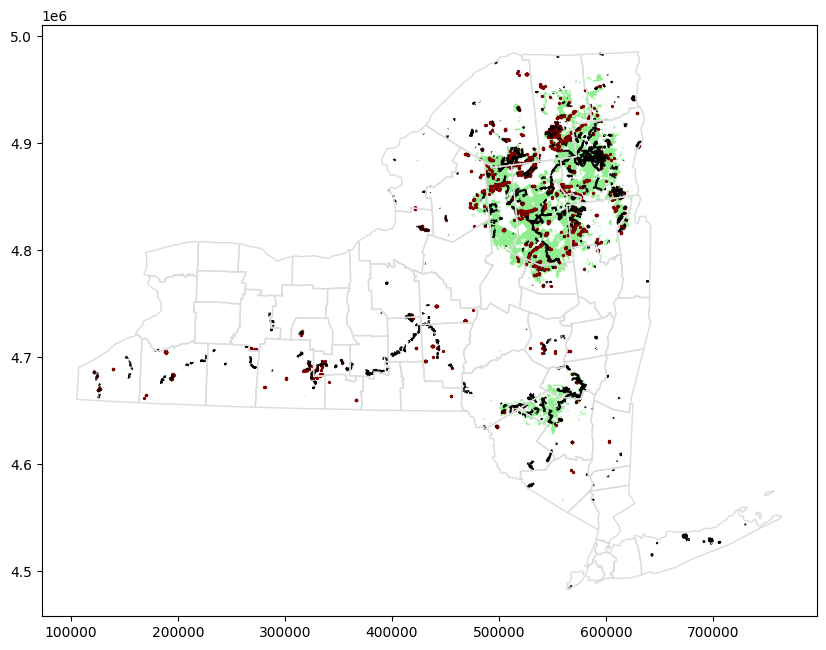

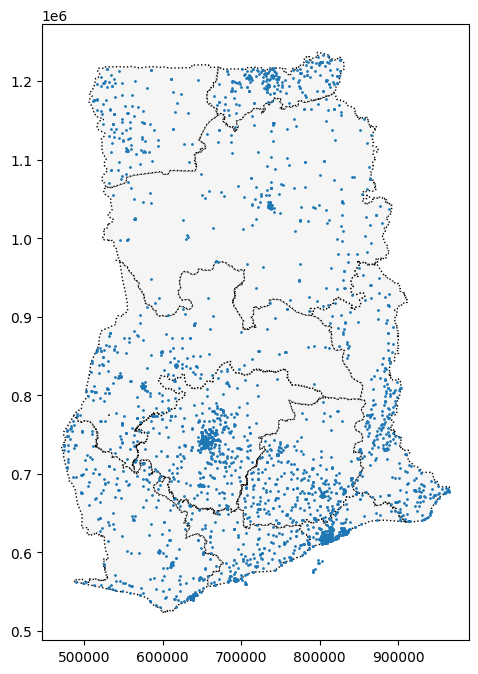

In [1]:
import pandas as pd
import geopandas as gpd

full_data = gpd.read_file("data/geo/DEC_lands/DEC_lands.shp")    # need additional .dbf, .prj files in the directory
print(full_data.head(),  type(full_data), full_data.crs)    # <class 'geopandas.geodataframe.GeoDataFrame'> EPSG:26918
data = full_data.loc[:, ["CLASS", "COUNTY", "geometry"]].copy()
print(data.CLASS.value_counts())
wild_lands = data.loc[data.CLASS.isin(['WILD FOREST', 'WILDERNESS'])]
# geometry datatype can contain a variety of different datatypes, each entry will typically be a Point, LineString, or Polygon.
# Campsites in New York state (Point)
POI_data = gpd.read_file("data/geo/DEC_pointsinterest/Decptsofinterest.shp")
campsites = POI_data.loc[POI_data.ASSET=='PRIMITIVE CAMPSITE'].copy()
# Foot trails in New York state (LineString)
roads_trails = gpd.read_file("data/geo/DEC_roadstrails/Decroadstrails.shp")
trails = roads_trails.loc[roads_trails.ASSET=='FOOT TRAIL'].copy()
# County boundaries in New York state (Polygon)
counties = gpd.read_file("data/geo/NY_county_boundaries/NY_county_boundaries.shp")

# Define a base map with county boundaries
ax = counties.plot(figsize=(10,10), color='none', edgecolor='gainsboro', zorder=3)
# Add wild lands, campsites, and foot trails to the base map
wild_lands.plot(color='lightgreen', ax=ax)
campsites.plot(color='maroon', markersize=2, ax=ax)
trails.plot(color='black', markersize=1, ax=ax)
print(trails.crs)

# Convert csv (with longitude, latitude columns) to GeoDataFrame
regions = gpd.read_file("data/geo/ghana/Map_of_Regions_in_Ghana.shp")
print(regions.crs)
facilities_df = pd.read_csv("data/geo/ghana/health_facilities.csv")
facilities = gpd.GeoDataFrame(facilities_df, geometry=gpd.points_from_xy(facilities_df.Longitude, facilities_df.Latitude))
    # gpd.points_from_xy() function creates Point objects from the latitude and longitude columns.
facilities.crs = {'init': 'epsg:4326'}
facilities.head()
ax = regions.plot(figsize=(8,8), color='whitesmoke', linestyle=':', edgecolor='black')
facilities.to_crs(epsg=32630).plot(markersize=1, ax=ax)    # changing the CRS, to_crs() modifies only the "geometry" column
# facilities.to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")
regions.to_crs(epsg=9835)
regions.loc[:, "AREA"] = regions.geometry.area / 10**6
print("Area of Ghana: {} square kilometers".format(regions.AREA.sum()))

## Interactive Maps

In [2]:
# Plotting points
import math
import folium
import  pandas as pd
from folium import Choropleth, Circle, Marker, GeoJson
from folium.plugins import HeatMap, MarkerCluster
import matplotlib.pyplot as plt
# create interactive map able to drag and zoom
m_1 = folium.Map(location=[42.32,-71.0589], tiles='openstreetmap', zoom_start=10)
    # location: sets the initial center of the map, tile: styling of the map;

crimes = pd.read_csv("data/crime.csv", encoding='latin-1')
crimes.dropna(subset=['Lat', 'Long', 'DISTRICT'], inplace=True)
crimes = crimes[crimes.OFFENSE_CODE_GROUP.isin([
    'Larceny', 'Auto Theft', 'Robbery', 'Larceny From Motor Vehicle', 'Residential Burglary',
    'Simple Assault', 'Harassment', 'Ballistics', 'Aggravated Assault', 'Other Burglary',
    'Arson', 'Commercial Burglary', 'HOME INVASION', 'Homicide', 'Criminal Harassment',
    'Manslaughter'])]
crimes = crimes[crimes.YEAR>=2018]
daytime_robberies = crimes[((crimes.OFFENSE_CODE_GROUP == 'Robbery') & (crimes.HOUR.isin(range(9,18))))]
m_2 = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=13)
# Add points to the map
for idx, row in daytime_robberies.iterrows():
    Marker([row['Lat'], row['Long']]).add_to(m_2)  #  add markers to the map
m_2

In [3]:
# Plotting points with markercluster
m_3 = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=13)
mc = MarkerCluster()            # If have lots of markers jammed at small area, replace with dynamic cluster with variable size.
for idx, row in daytime_robberies.iterrows():
    if not math.isnan(row['Long']) and not math.isnan(row['Lat']):
        mc.add_child(Marker([row['Lat'], row['Long']]))
m_3.add_child(mc)
# m_3.save('map.html')
m_3

In [4]:
# Bubble map
m_4 = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=13)
def color_producer(val):
    return 'forestgreen'if val <= 12 else 'darkred'

# Add a bubble map to the base map
for i in range(0,len(daytime_robberies)):
    Circle(
        location=[daytime_robberies.iloc[i]['Lat'], daytime_robberies.iloc[i]['Long']],
        radius=20,            # radius: sets the radius(variable) of the circle
        color=color_producer(daytime_robberies.iloc[i]['HOUR'])).add_to(m_4)
m_4

In [5]:
# Heatmap
m_5 = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=12)
# Add a heatmap to the base map
HeatMap(data=crimes[['Lat', 'Long']], radius=10).add_to(m_5)  # radius: controls the radius of one data
# Display the map
m_5

In [6]:
districts_full = gpd.read_file('data/geo/Police_Districts/Police_Districts.shp')
districts = districts_full[["DISTRICT", "geometry"]].set_index("DISTRICT")
plot_dict = crimes.DISTRICT.value_counts()   # plot_dict must has the same index as districts
plot_dict.head()

m_6 = folium.Map(location=[42.32,-71.0589], tiles='cartodbpositron', zoom_start=12)
# Add a choropleth map to the base map
Choropleth(geo_data=districts.__geo_interface__,
           # geo_data: a GeoJSON FeatureCollection containing the boundaries of each geographical area.
           data=plot_dict,
           key_on="feature.id",       # key_on will always be set to feature.id
           fill_color='YlGnBu',
           legend_name='Major criminal incidents (Jan-Aug 2018)'
          ).add_to(m_6)
m_6

## Manipulating Geospatial Data

In [7]:
# Geo Coding

from geopy.geocoders import Nominatim
import pandas as pd
import geopandas as gpd
import numpy as np
import folium
from folium import Marker

# Nominatim refers to the geocoding software that will be used to generate locations.
geolocator = Nominatim(user_agent="cch")
location = geolocator.geocode("Pyramid of Khufu")   # apply the name or address
    # return a geopy.location.Location object, might fail to decode
print(location.point, location.address) # "point" attribute is a geopy.point.Point object
print("Latitude:", location.point.latitude, "Longitude:", location.point.longitude)

universities = pd.read_csv("data/top_universities.csv")
def my_geocoder(row):
    try:
        point = geolocator.geocode(row).point
        return pd.Series({'Latitude': point.latitude, 'Longitude': point.longitude})
    except:
        return None

universities[['Latitude', 'Longitude']] = universities.apply(lambda x: my_geocoder(x['Name']), axis=1)

print("{}% of addresses were geocoded!".format(
    (1 - sum(np.isnan(universities["Latitude"])) / len(universities)) * 100))

# Drop universities that were not successfully geocoded
universities = universities.loc[~np.isnan(universities["Latitude"])]
universities = gpd.GeoDataFrame(
    universities, geometry=gpd.points_from_xy(universities.Longitude, universities.Latitude))
universities.crs = {'init': 'epsg:4326'}
universities.head()
m = folium.Map(location=[54, 15], tiles='openstreetmap', zoom_start=2)

for idx, row in universities.iterrows():
    Marker([row['Latitude'], row['Longitude']], popup=row['Name']).add_to(m)

29 58m 44.976s N, 31 8m 3.17625s E هرم خوفو, شارع ابو الهول السياحي, نزلة البطران, الجيزة, 12556, مصر
Latitude: 29.97916 Longitude: 31.134215625236113
91.0% of addresses were geocoded!


d:\Python\Python39\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


## Reinforcement Learning
    For each potential move, you predict what your opponent is likely to do in response, along with how you'd
        then respond, and what the opponent is likely to do then, and so on. Then, you choose the move that
        you think is most likely to result in a win. We can formalize this idea and represent all possible
        outcomes in a (complete) game tree.
    Game Tree: represents each possible move (by agent and opponent), starting with an empty board. The first
        row shows all possible moves the agent (red player) can make. Next, we record each move the opponent
        (yellow player) can make in response, and so on, until each branch reaches the end of the game.
        Once we can see every way the game can possibly end, it can help us to pick the move where we are most
        likely to win.
    Heuristic: The complete game tree is too big. So in practice, our agent only works with a small subset
        when planning a move. To make sure the incomplete tree is still useful to the agent, we will use a
        (or heuristic function). The heuristic assigns scores to different game boards, where we estimate
        that boards with higher scores are more likely to result in the agent winning the game. You will
        design the heuristic based on your knowledge of the game.

        For instance, one heuristic that might work reasonably well for Connect Four looks at each group of
            four adjacent locations in a (horizontal, vertical, or diagonal) line and assigns:
            1000000 (1e6) points if the agent has four discs in a row (the agent won),
            1 point if the agent filled three spots, and the remaining spot is empty (the agent wins if it
                fills in the empty spot), and
            -100 points if the opponent filled three spots, and the remaining spot is empty (the opponent
                wins by filling in the empty spot).
            We use the heuristic to assign a score to each board. To do this, we search the grid and look for
                all occurrences of the pattern in the heuristic. Each occurrence modifies the score.
            In general, if you're not sure how to design your heuristic, often the best thing to do is to
                simply take an initial guess and then play against your agent. This will let you identify
                specific cases when your agent makes bad moves, which can fix by modifying the heuristic.
    One-step lookahead: agent looks only one step into the future, instead of deeper in the game tree.

In [5]:
from kaggle_environments import make, evaluate
import random
import numpy as np

# Connect Four is a game where two players alternate turns dropping colored discs into a vertical
# grid. Each player uses a different color (usually red or yellow), and the objective of the game
# is to be the first player to get four discs in a row.

# Set debug=True to see the errors if your agent refuses to run
env = make("connectx", debug=True)   # Create the game environment
# List of available default agents


# Your agent should be implemented as a Python function that accepts two arguments: obs and config.
# It returns an integer with the selected column, where indexing starts at zero. So, the returned
# value is one of 0-6, inclusive.
# obs:  obs.board - the game board;  obs.mark - the piece assigned to the agent (either 1 or 2)
# config:  config.columns / rows - number of columns / rows in the game board
# config.inarow - number of pieces needs to get in a row in order to win

# Selects random valid column
def agent_random(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return random.choice(valid_moves)

# Selects middle column
def agent_middle(obs, config):
    return config.columns//2

# Selects leftmost valid column
def agent_leftmost(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return valid_moves[0]

def get_win_percentages(agent1, agent2, n_rounds=100):
    # Use default Connect Four setup
    config = {'rows': 6, 'columns': 7, 'inarow': 4}
    # Agent 1 goes first (roughly) half the time
    outcomes = evaluate("connectx", [agent1, agent2], config, [], n_rounds//2)
    # Agent 2 goes first (roughly) half the time
    outcomes += [[b,a] for [a,b] in evaluate("connectx", [agent2, agent1], config, [], n_rounds-n_rounds//2)]
    print("Agent 1 Win Percentage:", np.round(outcomes.count([1,-1])/len(outcomes), 2))
    print("Agent 2 Win Percentage:", np.round(outcomes.count([-1,1])/len(outcomes), 2))
    print("Number of Invalid Plays by Agent 1:", outcomes.count([None, 0]))
    print("Number of Invalid Plays by Agent 2:", outcomes.count([0, None]))


print(list(env.agents))
env.run(["random", agent_leftmost])   # Two random agents play one game round
env.render(mode="ipython")  # Show the game

get_win_percentages(agent1=agent_middle, agent2=agent_random)
get_win_percentages(agent1=agent_leftmost, agent2=agent_random)
    # agent that chooses the leftmost valid column performs best

['random', 'negamax']


Agent 1 Win Percentage: 0.65
Agent 2 Win Percentage: 0.0
Number of Invalid Plays by Agent 1: 35
Number of Invalid Plays by Agent 2: 0
Agent 1 Win Percentage: 0.75
Agent 2 Win Percentage: 0.25
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


In [8]:
# Spatial Join
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
europe = world.loc[world.continent == 'Europe'].reset_index(drop=True)

europe_stats = europe[["name", "pop_est", "gdp_md_est"]]
europe_boundaries = europe[["name", "geometry"]]
europe = europe_boundaries.merge(europe_stats, on="name")
print(europe.head())
# Use spatial join to match universities to countries in Europe
european_universities = gpd.sjoin(universities, europe, how='inner')    # different types of joins, left, right...
print("We located {} universities.".format(len(universities)))
print("Only {} of the universities were located in Europe (in {} different countries).".format(
    len(european_universities), len(european_universities.name.unique())))
print(european_universities.head())

      name                                           geometry      pop_est  \
0   Russia  MULTIPOLYGON (((180.00000 71.51571, 180.00000 ...  144373535.0   
1   Norway  MULTIPOLYGON (((15.14282 79.67431, 15.52255 80...    5347896.0   
2   France  MULTIPOLYGON (((-51.65780 4.15623, -52.24934 3...   67059887.0   
3   Sweden  POLYGON ((11.02737 58.85615, 11.46827 59.43239...   10285453.0   
4  Belarus  POLYGON ((28.17671 56.16913, 29.22951 55.91834...    9466856.0   

   gdp_md_est  
0     1699876  
1      403336  
2     2715518  
3      530883  
4       63080  
We located 91 universities.
Only 86 of the universities were located in Europe (in 14 different countries).
                                               Name   Latitude  Longitude  \
0                              University of Oxford  51.752546  -1.214330   
1                           University of Cambridge  52.200623   0.110474   
2                           Imperial College London  51.498959  -0.175641   
4                  

C:\Users\caich\AppData\Local\Temp\ipykernel_19028\1190226816.py:10: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  european_universities = gpd.sjoin(universities, europe, how='inner')    # different types of joins, left, right...


## Proximity Analysis

Mean distance to monitoring stations: 33516.28487007786 feet
Closest monitoring station (3780.623590556444 feet):
ADDRESS      3100 Penrose Ferry Road
LATITUDE                    39.91279
LONGITUDE                 -75.185448
Name: 9, dtype: object
Type: <class 'shapely.geometry.multipolygon.MultiPolygon'>
True


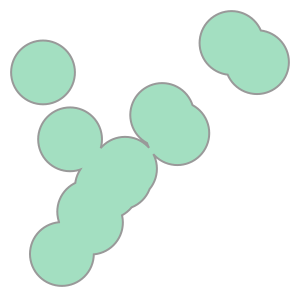

In [9]:
# Measure distance
releases = gpd.read_file("data/geo/toxic_release_pennsylvania/toxic_release_pennsylvania.shp")
stations = gpd.read_file("data/geo/PhillyHealth_Air_Monitoring_Stations/PhillyHealth_Air_Monitoring_Stations.shp")

recent_release = releases.iloc[8]  # Select one release incident in particular
distances = stations.geometry.distance(recent_release.geometry)  # Measure distance from release to each station
print('Mean distance to monitoring stations: {} feet'.format(distances.mean()))
print('Closest monitoring station ({} feet):'.format(distances.min()))
print(stations.iloc[distances.idxmin()][["ADDRESS", "LATITUDE", "LONGITUDE"]])



# create buffer to detect object in radius
two_mile_buffer = stations.geometry.buffer(2*5280)    # 1 mile = 5280 ft, 12 edge polygon close to circle
# Create map with release incidents and monitoring stations
m = folium.Map(location=[39.9526,-75.1652], zoom_start=11)
HeatMap(data=releases[['LATITUDE', 'LONGITUDE']], radius=15).add_to(m)
for idx, row in stations.iterrows():
    Marker([row['LATITUDE'], row['LONGITUDE']]).add_to(m)

GeoJson(two_mile_buffer.to_crs(epsg=4326)).add_to(m)  # Plot each polygon on the map
# Turn group of polygons into single multipolygon
my_union = two_mile_buffer.geometry.unary_union
print('Type:', type(my_union))
# Show the MultiPolygon object
print(my_union.contains(releases.iloc[8].geometry))  # 8th release is inside 2 miles radius of some station
my_union

## Reinforcement learning
    Connect Four: is a game where two players alternate turns dropping colored discs into a vertical grid. Each 
        player uses a different color (usually red or yellow), and the objective of the game is to be the first 
        player to get four discs in a row. A move is considered valid if there's still space in the column to 
        place a disc 
    Game Tree: for each potential move, predict what your opponent is likely to do in response, along with how 
        you'd then respond, and what the opponent is likely to do then, and so on. Then, you choose the move 
        that you think is most likely to result in a win. We can formalize this idea and represent all possible 
        outcomes in a (complete) game tree.
    Heuristic: the complete game tree is too big. So in practice, agent only works with a small subset when 
        planning a move. To make sure the incomplete tree is still useful to the agent, we use a heuristic (or 
        heuristic function). The heuristic assigns scores to different game boards, where we estimate that 
        boards with higher scores are more likely to result in the agent winning the game. You will design the 
        heuristic based on your knowledge of the game.
        For instance, one heuristic that might work reasonably well for Connect Four looks at each group of 
        four adjacent locations in a (horizontal, vertical, or diagonal) line and assigns:
            1000000 (1e6) points if the agent has four discs in a row (the agent won),
            1 point if the agent filled three spots, and the remaining spot is empty (the agent wins if it 
                fills in the empty spot)
            -100 points if the opponent filled three spots, and the remaining spot is empty (the opponent wins 
                by filling in the empty spot).
        In general, if not sure how to design your heuristic, often the best thing to do is to simply take an 
            initial guess and then play against your agent. This will let you identify specific cases when your 
            agent makes bad moves, which you can then fix by modifying the heuristic.       
    One-step lookahead: agent looks only one step (or move) into the future, instead of deeper in the game tree.
    Minimax Algorithm: the agent chooses moves to get a score that is as high as possible, and it assumes the 
        opponent will counteract this by choosing moves to force the score to be as low as possible. That is, 
        the agent and opponent have opposing goals, and we assume the opponent plays optimally.
    Neural Networks: replace the heuristic with a neural network. The network accepts the current board as input. 
        And, it outputs a probability for each possible move. Then, the agent selects a move by sampling from 
        these probabilities. This way, to encode a good gameplay strategy, we need only amend the weights of the 
        network so that for every possible game board, it assigns higher probabilities to better moves.
        Setup: After each move, we give the agent a reward that tells it how well it did. At the end of each game, 
        the agent adds up its reward. We refer to the sum of rewards as the agent's cumulative reward.
    Reinforcement Learning: There are many reinforcement learning models: DQN, A2C, and PPO, all of these 
        algorithms use a similar process to produce an agent:
            Initially, the weights are set to random values. As the agent plays the game, the algorithm continually 
            tries out new values for the weights, to see how the cumulative reward is affected, on average. Over 
            time, the algorithm settles towards weights that performed better.

In [ ]:
from kaggle_environments import make, evaluate
import numpy as np
# Create the game environment
# Set debug=True to see the errors if your agent refuses to run
env = make("connectx", debug=True)

def get_win_percentages(agent1, agent2, n_rounds=100):
    # Use default Connect Four setup
    config = {'rows': 6, 'columns': 7, 'inarow': 4}
    # Agent 1 goes first (roughly) half the time          
    outcomes = evaluate("connectx", [agent1, agent2], config, [], n_rounds//2)
    # Agent 2 goes first (roughly) half the time      
    outcomes += [[b,a] for [a,b] in evaluate("connectx", [agent2, agent1], config, [], n_rounds-n_rounds//2)]
    print(f"For {n_rounds} games, Agent 1 Win Percentage:", np.round(outcomes.count([1,-1])/len(outcomes), 2))
    print(f"For {n_rounds} games, Agent 2 Win Percentage:", np.round(outcomes.count([-1,1])/len(outcomes), 2))
    print("Number of Invalid Plays by Agent 1:", outcomes.count([None, 0]))
    print("Number of Invalid Plays by Agent 2:", outcomes.count([0, None]))


# agent should be implemented as a Python function that accepts two arguments: obs and 
# config. It returns an integer with the selected column
# obs:  obs.board - the game board;  obs.mark - the piece assigned to the agent (either 1 or 2)
# config: config.columns/rows - number of columns/rows in the game board 
# config.inarow - number of pieces a player needs to get in a row in order to win

# Selects random valid column
def agent_random(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return random.choice(valid_moves)

# Selects middle column
def agent_middle(obs, config):
    return config.columns//2

# Selects leftmost valid column
def agent_leftmost(obs, config):
    valid_moves = [col for col in range(config.columns) if obs.board[col] == 0]
    return valid_moves[0]

# List of available default agents
print(list(env.agents))

env.run(["random", agent_leftmost])   # Two random agents play one game round
env.render(mode="ipython")    # Show the game

get_win_percentages(agent1=agent_middle, agent2=agent_random)
get_win_percentages(agent1=agent_leftmost, agent2=agent_random)   
# agent that chooses the leftmost valid column performs bes

## One-Step Look Ahead

In [ ]:
from kaggle_environments import make, evaluate

import random
import numpy as np

# Gets board at next step if agent drops piece in selected column
def drop_piece(grid, col, mark, config):
    next_grid = grid.copy()
    for row in range(config.rows-1, -1, -1):
        if next_grid[row][col] == 0:
            break
    next_grid[row][col] = mark
    return next_grid

# Helper function for get_heuristic: checks if window satisfies heuristic conditions
def check_window(window, num_discs, piece, config):
    return (window.count(piece) == num_discs and window.count(0) == config.inarow-num_discs)
    
# Helper function for get_heuristic: counts number of windows satisfying specified heuristic conditions
def count_windows(grid, num_discs, piece, config):
    num_windows = 0
    # horizontal
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    return num_windows

# Helper function for minimax: calculates value of heuristic for grid
def get_heuristic(grid, mark, config):
    num_threes = count_windows(grid, 3, mark, config)
    num_fours = count_windows(grid, 4, mark, config)
    num_threes_opp = count_windows(grid, 3, mark%2+1, config)
    num_fours_opp = count_windows(grid, 4, mark%2+1, config)
    score = num_threes - 1e2*num_threes_opp - 1e4*num_fours_opp + 1e6*num_fours
    return score

# Calculates score if agent drops piece in selected column
def score_move(grid, col, mark, config):
    next_grid = drop_piece(grid, col, mark, config)
    score = get_heuristic(next_grid, mark, config)
    return score





# The agent is always implemented as a Python function that accepts two arguments: obs and config
def agent(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next turn
    scores = dict(zip(valid_moves, [score_move(grid, col, obs.mark, config) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)

env = make("connectx")       # Create the game environment
env.run([agent, "random"])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent, agent2="random")

## N-Step Ahead (Minmax Algorithm)

In [ ]:
# Uses minimax to calculate value of dropping piece in selected column
def score_move2(grid, col, mark, config, nsteps):
    next_grid = drop_piece(grid, col, mark, config)
    score = minimax(next_grid, nsteps-1, False, mark, config)
    return score

# Helper function for minimax: checks if agent or opponent has four in a row in the window
def is_terminal_window(window, config):
    return window.count(1) == config.inarow or window.count(2) == config.inarow

# Helper function for minimax: checks if game has ended
def is_terminal_node(grid, config):
    # Check for draw 
    if list(grid[0, :]).count(0) == 0:
        return True
    # Check for win: horizontal, vertical, or diagonal
    # horizontal 
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if is_terminal_window(window, config):
                return True
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if is_terminal_window(window, config):
                return True
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    return False

# Minimax implementation
def minimax(node, depth, maximizingPlayer, mark, config):     # node is the grid
    is_terminal = is_terminal_node(node, config)
    valid_moves = [c for c in range(config.columns) if node[0][c] == 0]
    if depth == 0 or is_terminal:
        return get_heuristic(node, mark, config)
    if maximizingPlayer:
        value = -np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark, config)
            value = max(value, minimax(child, depth-1, False, mark, config))
        return value
    else:
        value = np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark%2+1, config)
            value = min(value, minimax(child, depth-1, True, mark, config))
        return value

N_STEPS = 3

def agent2(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next step
    scores = dict(zip(valid_moves, [score_move2(grid, col, obs.mark, config, N_STEPS) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)

env = make("connectx")       # Create the game environment
env.run([agent, "random"])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent, agent2=agent2)

## Reinforcement Learning

In [ ]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import gym
from kaggle_environments import make, evaluate
from gym import spaces

class ConnectFourGym(gym.Env):
    def __init__(self, agent2=agent2):
        ks_env = make("connectx", debug=True)
        self.env = ks_env.train([None, agent2])
        self.rows = ks_env.configuration.rows
        self.columns = ks_env.configuration.columns
        # Learn about spaces here: http://gym.openai.com/docs/#spaces
        self.action_space = spaces.Discrete(self.columns)
        self.observation_space = spaces.Box(low=0, high=2, 
                                            shape=(1,self.rows,self.columns), dtype=int)
        # Tuple corresponding to the min and max possible rewards
        self.reward_range = (-10, 1)
        # StableBaselines throws error if these are not defined
        self.spec = None
        self.metadata = None
    def reset(self):
        self.obs = self.env.reset()
        return np.array(self.obs['board']).reshape(1,self.rows,self.columns)
    def change_reward(self, old_reward, done):
        if old_reward == 1: # The agent won the game
            return 1
        elif done: # The opponent won the game
            return -1
        else: # Reward 1/42
            return 1/(self.rows*self.columns)
    def step(self, action):
        # Check if agent's move is valid
        is_valid = (self.obs['board'][int(action)] == 0)
        if is_valid: # Play the move
            self.obs, old_reward, done, _ = self.env.step(int(action))
            reward = self.change_reward(old_reward, done)
        else: # End the game and penalize agent
            reward, done, _ = -10, True, {}
        return np.array(self.obs['board']).reshape(1,self.rows,self.columns), reward, done, _


# Create ConnectFour environment 
env = ConnectFourGym(agent2=agent2)
import torch as th
import torch.nn as nn

# !pip install "stable-baselines3"
from stable_baselines3 import PPO 
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor

# Neural network for predicting action values
class CustomCNN(BaseFeaturesExtractor):
    
    def __init__(self, observation_space: gym.spaces.Box, features_dim: int=128):
        super(CustomCNN, self).__init__(observation_space, features_dim)
        # CxHxW images (channels first)
        n_input_channels = observation_space.shape[0]
        self.cnn = nn.Sequential(
            nn.Conv2d(n_input_channels, 32, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
        )

        # Compute shape by doing one forward pass
        with th.no_grad():
            n_flatten = self.cnn(
                th.as_tensor(observation_space.sample()[None]).float()
            ).shape[1]

        self.linear = nn.Sequential(nn.Linear(n_flatten, features_dim), nn.ReLU())

    def forward(self, observations: th.Tensor) -> th.Tensor:
        return self.linear(self.cnn(observations))

policy_kwargs = dict(
    features_extractor_class=CustomCNN,
)
        
# Initialize agent
model = PPO("CnnPolicy", env, policy_kwargs=policy_kwargs, verbose=0)
# Train agent
model.learn(total_timesteps=60000)
def agent3(obs, config):
    # Use the best model to select a column
    col, _ = model.predict(np.array(obs['board']).reshape(1, 6,7))
    # Check if selected column is valid
    is_valid = (obs['board'][int(col)] == 0)
    # If not valid, select random move. 
    if is_valid:
        return int(col)
    else:
        return random.choice([col for col in range(config.columns) if obs.board[int(col)] == 0])
env = make("connectx")       # Create the game environment
env.run([agent3, agent2])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent3, agent2=agent2)

In [2]:
from kaggle_environments import make, evaluate

import random
import numpy as np

# Gets board at next step if agent drops piece in selected column
def drop_piece(grid, col, mark, config):
    next_grid = grid.copy()
    for row in range(config.rows-1, -1, -1):
        if next_grid[row][col] == 0:
            break
    next_grid[row][col] = mark
    return next_grid

# Helper function for get_heuristic: checks if window satisfies heuristic conditions
def check_window(window, num_discs, piece, config):
    return (window.count(piece) == num_discs and window.count(0) == config.inarow-num_discs)
    
# Helper function for get_heuristic: counts number of windows satisfying specified heuristic conditions
def count_windows(grid, num_discs, piece, config):
    num_windows = 0
    # horizontal
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if check_window(window, num_discs, piece, config):
                num_windows += 1
    return num_windows

# Helper function for minimax: calculates value of heuristic for grid
def get_heuristic(grid, mark, config):
    num_threes = count_windows(grid, 3, mark, config)
    num_fours = count_windows(grid, 4, mark, config)
    num_threes_opp = count_windows(grid, 3, mark%2+1, config)
    num_fours_opp = count_windows(grid, 4, mark%2+1, config)
    score = num_threes - 1e2*num_threes_opp - 1e4*num_fours_opp + 1e6*num_fours
    return score

# Calculates score if agent drops piece in selected column
def score_move(grid, col, mark, config):
    next_grid = drop_piece(grid, col, mark, config)
    score = get_heuristic(next_grid, mark, config)
    return score





# The agent is always implemented as a Python function that accepts two arguments: obs and config
def agent(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next turn
    scores = dict(zip(valid_moves, [score_move(grid, col, obs.mark, config) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)

env = make("connectx")       # Create the game environment
env.run([agent, "random"])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent, agent2="random")

For 100 games, Agent 1 Win Percentage: 1.0
For 100 games, Agent 2 Win Percentage: 0.0
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


## N-Step Ahead (Minmax Algorithm)

In [3]:
# Uses minimax to calculate value of dropping piece in selected column
def score_move2(grid, col, mark, config, nsteps):
    next_grid = drop_piece(grid, col, mark, config)
    score = minimax(next_grid, nsteps-1, False, mark, config)
    return score

# Helper function for minimax: checks if agent or opponent has four in a row in the window
def is_terminal_window(window, config):
    return window.count(1) == config.inarow or window.count(2) == config.inarow

# Helper function for minimax: checks if game has ended
def is_terminal_node(grid, config):
    # Check for draw 
    if list(grid[0, :]).count(0) == 0:
        return True
    # Check for win: horizontal, vertical, or diagonal
    # horizontal 
    for row in range(config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[row, col:col+config.inarow])
            if is_terminal_window(window, config):
                return True
    # vertical
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns):
            window = list(grid[row:row+config.inarow, col])
            if is_terminal_window(window, config):
                return True
    # positive diagonal
    for row in range(config.rows-(config.inarow-1)):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row+config.inarow), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    # negative diagonal
    for row in range(config.inarow-1, config.rows):
        for col in range(config.columns-(config.inarow-1)):
            window = list(grid[range(row, row-config.inarow, -1), range(col, col+config.inarow)])
            if is_terminal_window(window, config):
                return True
    return False

# Minimax implementation
def minimax(node, depth, maximizingPlayer, mark, config):     # node is the grid
    is_terminal = is_terminal_node(node, config)
    valid_moves = [c for c in range(config.columns) if node[0][c] == 0]
    if depth == 0 or is_terminal:
        return get_heuristic(node, mark, config)
    if maximizingPlayer:
        value = -np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark, config)
            value = max(value, minimax(child, depth-1, False, mark, config))
        return value
    else:
        value = np.Inf
        for col in valid_moves:
            child = drop_piece(node, col, mark%2+1, config)
            value = min(value, minimax(child, depth-1, True, mark, config))
        return value

N_STEPS = 3

def agent2(obs, config):
    # Get list of valid moves
    valid_moves = [c for c in range(config.columns) if obs.board[c] == 0]
    # Convert the board to a 2D grid
    grid = np.asarray(obs.board).reshape(config.rows, config.columns)
    # Use the heuristic to assign a score to each possible board in the next step
    scores = dict(zip(valid_moves, [score_move2(grid, col, obs.mark, config, N_STEPS) for col in valid_moves]))
    # Get a list of columns (moves) that maximize the heuristic
    max_cols = [key for key in scores.keys() if scores[key] == max(scores.values())]
    # Select at random from the maximizing columns
    return random.choice(max_cols)

env = make("connectx")       # Create the game environment
env.run([agent, "random"])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent, agent2=agent2)

For 100 games, Agent 1 Win Percentage: 0.17
For 100 games, Agent 2 Win Percentage: 0.82
Number of Invalid Plays by Agent 1: 0
Number of Invalid Plays by Agent 2: 0


## Reinforcement Learning

In [7]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import gym
from kaggle_environments import make, evaluate
from gym import spaces

class ConnectFourGym(gym.Env):
    def __init__(self, agent2=agent2):
        ks_env = make("connectx", debug=True)
        self.env = ks_env.train([None, agent2])
        self.rows = ks_env.configuration.rows
        self.columns = ks_env.configuration.columns
        # Learn about spaces here: http://gym.openai.com/docs/#spaces
        self.action_space = spaces.Discrete(self.columns)
        self.observation_space = spaces.Box(low=0, high=2, 
                                            shape=(1,self.rows,self.columns), dtype=int)
        # Tuple corresponding to the min and max possible rewards
        self.reward_range = (-10, 1)
        # StableBaselines throws error if these are not defined
        self.spec = None
        self.metadata = None
    def reset(self):
        self.obs = self.env.reset()
        return np.array(self.obs['board']).reshape(1,self.rows,self.columns)
    def change_reward(self, old_reward, done):
        if old_reward == 1: # The agent won the game
            return 1
        elif done: # The opponent won the game
            return -1
        else: # Reward 1/42
            return 1/(self.rows*self.columns)
    def step(self, action):
        # Check if agent's move is valid
        is_valid = (self.obs['board'][int(action)] == 0)
        if is_valid: # Play the move
            self.obs, old_reward, done, _ = self.env.step(int(action))
            reward = self.change_reward(old_reward, done)
        else: # End the game and penalize agent
            reward, done, _ = -10, True, {}
        return np.array(self.obs['board']).reshape(1,self.rows,self.columns), reward, done, _


# Create ConnectFour environment 
env = ConnectFourGym(agent2=agent2)
import torch as th
import torch.nn as nn

# !pip install "stable-baselines3"
from stable_baselines3 import PPO 
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor

# Neural network for predicting action values
class CustomCNN(BaseFeaturesExtractor):
    
    def __init__(self, observation_space: gym.spaces.Box, features_dim: int=128):
        super(CustomCNN, self).__init__(observation_space, features_dim)
        # CxHxW images (channels first)
        n_input_channels = observation_space.shape[0]
        self.cnn = nn.Sequential(
            nn.Conv2d(n_input_channels, 32, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
        )

        # Compute shape by doing one forward pass
        with th.no_grad():
            n_flatten = self.cnn(
                th.as_tensor(observation_space.sample()[None]).float()
            ).shape[1]

        self.linear = nn.Sequential(nn.Linear(n_flatten, features_dim), nn.ReLU())

    def forward(self, observations: th.Tensor) -> th.Tensor:
        return self.linear(self.cnn(observations))

policy_kwargs = dict(
    features_extractor_class=CustomCNN,
)
        
# Initialize agent
model = PPO("CnnPolicy", env, policy_kwargs=policy_kwargs, verbose=0)
# Train agent
model.learn(total_timesteps=60000)
def agent3(obs, config):
    # Use the best model to select a column
    col, _ = model.predict(np.array(obs['board']).reshape(1, 6,7))
    # Check if selected column is valid
    is_valid = (obs['board'][int(col)] == 0)
    # If not valid, select random move. 
    if is_valid:
        return int(col)
    else:
        return random.choice([col for col in range(config.columns) if obs.board[int(col)] == 0])
env = make("connectx")       # Create the game environment
env.run([agent3, agent2])   # Two random agents play one game round
# env.render(mode="ipython")   # Show the game
get_win_percentages(agent1=agent3, agent2=agent2)

     ---------------------------------------- 0.0/171.8 kB ? eta -:--:--
     --------------------------------- ---- 153.6/171.8 kB 4.6 MB/s eta 0:00:01
     -------------------------------------- 171.8/171.8 kB 3.4 MB/s eta 0:00:00
     ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
     -------------- ------------------------- 0.6/1.5 MB 11.5 MB/s eta 0:00:01
     -------------------------- ------------- 1.0/1.5 MB 10.7 MB/s eta 0:00:01
     ---------------------------------------- 1.5/1.5 MB 10.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for gym: filename=gym-0.21.0-py3-none-any.whl size=1616838 sha256=d93bc1561ebef52a7d8e4a1872ca235d21298c35c5056b713d6ee6bdb6b0f9aa
  Stored in directory: c:\users\caich\appdata\local\pip\cache\wheels\b3\50\6c\0a82c1358b4da2dbd9c1bb17e0f89467db32812ab236dbf6d5
Successfully built gym
  Attempting uninstall: importlib-metadata
    Found exist

In [4]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
import imp
imp.find_module('tensorflow')

C:\Users\caich\AppData\Local\Temp\ipykernel_23716\2522537656.py:1: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp


(None, 'd:\\Python\\Python39\\lib\\site-packages\\tensorflow', ('', '', 5))